In [1]:
try:
    import google.colab  # noqa: F401

    # specify the version of DataEval (==X.XX.X) for versions other than the latest
    %pip install -q dataeval[torch]
except Exception:
    pass

In [2]:
# You need the Counter for processing the labels.
from collections import Counter, defaultdict

# You will need matplotlib for visualing our dataset and numpy to be able to handle the data.
import matplotlib.pyplot as plt
import numpy as np

# You are importing torch in order to create image embeddings.
# You are only using torchvision to load in the dataset.
# If you already have the data stored on your computer in a numpy friendly manner,
# then feel free to load it directly into numpy arrays.
import torchvision.transforms.v2 as v2
from torchvision import datasets

# Load the classes from DataEval that are helpful for EDA
from dataeval.detectors.linters import Duplicates, Outliers
from dataeval.metrics.stats import channelstats, datasetstats, hashstats

# Set the random value
rng = np.random.default_rng(213)

In [3]:
# Download the data and then load it as a torch Tensor.
to_tensor = v2.ToImage()
ds = datasets.VOCDetection("./data", year="2011", image_set="train", download=True, transform=to_tensor)

Using downloaded and verified file: ./data/VOCtrainval_25-May-2011.tar
Extracting ./data/VOCtrainval_25-May-2011.tar to ./data


In [4]:
# Verify the size of the loaded dataset
len(ds)

5717

In [5]:
img_list = []
for data in ds:
    img_list.append(data[0].numpy())

In [6]:
# Check the label structure
ds[0][1]

{'annotation': {'folder': 'VOC2011',
  'filename': '2008_000008.jpg',
  'source': {'database': 'The VOC2008 Database',
   'annotation': 'PASCAL VOC2008',
   'image': 'flickr'},
  'size': {'width': '500', 'height': '442', 'depth': '3'},
  'segmented': '0',
  'object': [{'name': 'horse',
    'pose': 'Left',
    'truncated': '0',
    'occluded': '1',
    'bndbox': {'xmin': '53', 'ymin': '87', 'xmax': '471', 'ymax': '420'},
    'difficult': '0'},
   {'name': 'person',
    'pose': 'Unspecified',
    'truncated': '1',
    'occluded': '0',
    'bndbox': {'xmin': '158', 'ymin': '44', 'xmax': '289', 'ymax': '167'},
    'difficult': '0'}]}}

In [7]:
labels = []
for data in ds:
    objects = data[1]["annotation"]["object"]
    names = []
    for each in objects:
        names.append(each["name"])
    labels.append(names)

labels[0]

['horse', 'person']

In [8]:
# This grabs the total number of each object labelled and the number and index of images each object is present in
object_counts = Counter()
image_counts = Counter()
index_location = defaultdict(list)

for i, group in enumerate(labels):
    # Count occurrences of each object in all sublists
    object_counts.update(group)

    # Create a set of unique items in the current sublist
    unique_items = set(group)

    # Update image counts and index locations
    image_counts.update(unique_items)
    for item in unique_items:
        index_location[item].append(i)

# Display the results
print("     Object: Total Count - Image Count")
for obj in list(object_counts.keys()):
    print(f"{obj:>11}:    {object_counts[obj]:>4}     -   {image_counts[obj]:>4}")

     Object: Total Count - Image Count
      horse:     377     -    238
     person:    5019     -   2142
     bottle:     749     -    399
        dog:     768     -    636
  tvmonitor:     412     -    299
        car:    1191     -    621
  aeroplane:     470     -    328
    bicycle:     410     -    281
       boat:     508     -    264
      chair:    1457     -    656
diningtable:     373     -    318
pottedplant:     557     -    289
      train:     327     -    275
        cat:     609     -    540
       sofa:     399     -    359
       bird:     592     -    399
      sheep:     509     -    171
  motorbike:     375     -    274
        bus:     317     -    219
        cow:     355     -    155


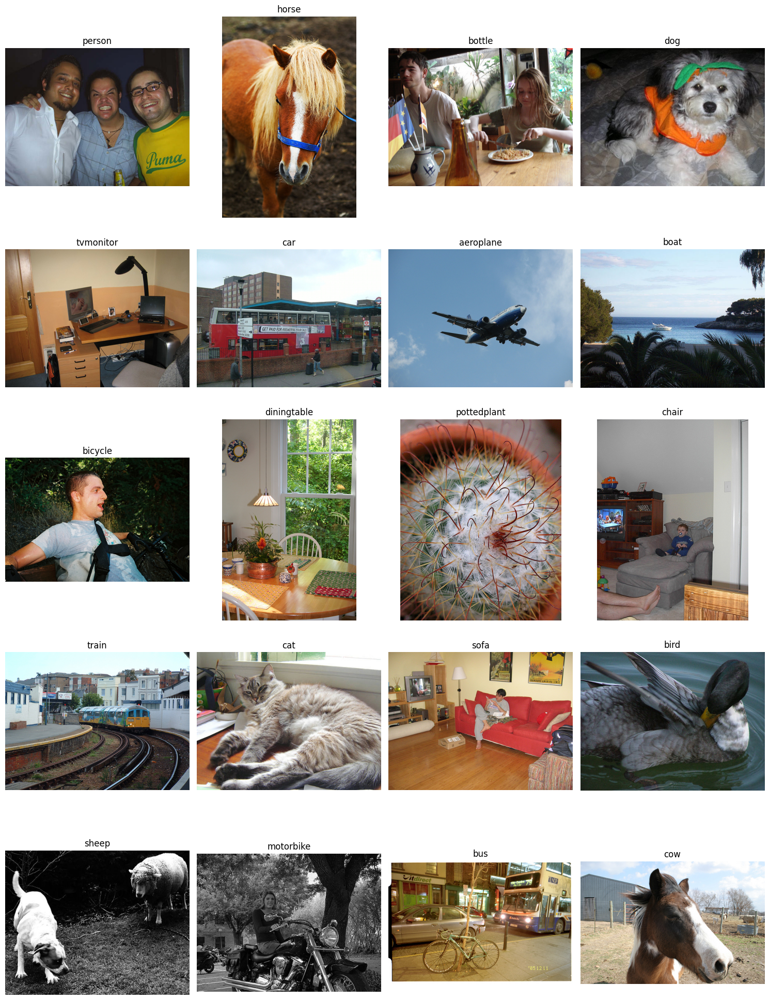

In [9]:
# Plot random images from each category
fig, axs = plt.subplots(5, 4, figsize=(15, 20))

for ax, (category, indices) in zip(axs.flat, index_location.items()):
    # Randomly select an index from the list of indices
    selected_index = rng.choice(indices)

    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index], 0, -1))
    ax.set_title(category)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [10]:
# This cell takes about 1-3 minutes to run depending on your hardware

# Calculate the dimensionstats, pixelstats and visualstats for the images
# Note: the stat functions expect the images as an iterable and in the (C,H,W) format

stats = datasetstats(img_list)

# Aggregate all of the results in a single dictionary
dataset_stats = stats.dict()

# View the list of metrics in the image stats class
list(dataset_stats)

  0%|                                                                                          | 0/5717 [00:00<?, ?it/s]

  0%|                                                                                  | 1/5717 [00:00<11:02,  8.63it/s]

  0%|▏                                                                                | 10/5717 [00:00<02:01, 46.94it/s]

  0%|▎                                                                                | 26/5717 [00:00<01:01, 93.03it/s]

  1%|▌                                                                                | 37/5717 [00:00<01:01, 92.08it/s]

  1%|▊                                                                               | 62/5717 [00:00<00:39, 143.85it/s]

  1%|█                                                                               | 78/5717 [00:00<00:41, 134.56it/s]

  2%|█▎                                                                              | 97/5717 [00:00<00:38, 147.67it/s]

  2%|█▌                                                                             | 116/5717 [00:00<00:36, 153.67it/s]

  2%|█▊                                                                             | 132/5717 [00:01<00:40, 136.89it/s]

  3%|██                                                                             | 153/5717 [00:01<00:37, 149.86it/s]

  3%|██▎                                                                            | 171/5717 [00:01<00:35, 154.94it/s]

  3%|██▌                                                                            | 189/5717 [00:01<00:35, 157.60it/s]

  4%|██▉                                                                            | 210/5717 [00:01<00:32, 167.53it/s]

  4%|███▏                                                                           | 229/5717 [00:01<00:35, 152.98it/s]

  4%|███▍                                                                           | 246/5717 [00:01<00:36, 151.64it/s]

  5%|███▋                                                                           | 263/5717 [00:01<00:35, 155.72it/s]

  5%|███▊                                                                           | 279/5717 [00:01<00:36, 150.84it/s]

  5%|████                                                                           | 295/5717 [00:02<00:36, 147.97it/s]

  5%|████▎                                                                          | 313/5717 [00:02<00:36, 148.60it/s]

  6%|████▌                                                                          | 331/5717 [00:02<00:35, 152.63it/s]

  6%|████▊                                                                          | 347/5717 [00:02<00:36, 148.35it/s]

  6%|█████                                                                          | 362/5717 [00:02<00:36, 146.38it/s]

  7%|█████▎                                                                         | 380/5717 [00:02<00:34, 155.15it/s]

  7%|█████▍                                                                         | 396/5717 [00:02<00:36, 143.86it/s]

  7%|█████▋                                                                         | 411/5717 [00:02<00:36, 143.81it/s]

  7%|█████▉                                                                         | 427/5717 [00:02<00:36, 146.10it/s]

  8%|██████▏                                                                        | 444/5717 [00:03<00:38, 136.34it/s]

  8%|██████▍                                                                        | 467/5717 [00:03<00:33, 156.86it/s]

  8%|██████▋                                                                        | 485/5717 [00:03<00:33, 158.46it/s]

  9%|██████▉                                                                        | 502/5717 [00:03<00:33, 154.14it/s]

  9%|███████▏                                                                       | 520/5717 [00:03<00:32, 158.10it/s]

  9%|███████▍                                                                       | 536/5717 [00:03<00:33, 153.56it/s]

 10%|███████▋                                                                       | 552/5717 [00:03<00:35, 147.44it/s]

 10%|███████▊                                                                       | 567/5717 [00:03<00:34, 148.06it/s]

 10%|████████                                                                       | 583/5717 [00:04<00:35, 144.32it/s]

 11%|████████▎                                                                      | 604/5717 [00:04<00:35, 143.99it/s]

 11%|████████▌                                                                      | 624/5717 [00:04<00:34, 148.02it/s]

 11%|████████▉                                                                      | 646/5717 [00:04<00:36, 140.60it/s]

 12%|█████████▎                                                                     | 672/5717 [00:04<00:30, 165.73it/s]

 12%|█████████▌                                                                     | 690/5717 [00:04<00:30, 164.75it/s]

 12%|█████████▊                                                                     | 707/5717 [00:04<00:30, 161.79it/s]

 13%|██████████                                                                     | 724/5717 [00:04<00:31, 159.18it/s]

 13%|██████████▏                                                                    | 741/5717 [00:05<00:32, 151.51it/s]

 13%|██████████▍                                                                    | 757/5717 [00:05<00:33, 148.50it/s]

 14%|██████████▋                                                                    | 772/5717 [00:05<00:35, 137.63it/s]

 14%|██████████▉                                                                    | 788/5717 [00:05<00:35, 137.90it/s]

 14%|███████████                                                                    | 803/5717 [00:05<00:39, 124.69it/s]

 14%|███████████▎                                                                   | 822/5717 [00:05<00:36, 133.06it/s]

 15%|███████████▌                                                                   | 841/5717 [00:05<00:36, 133.12it/s]

 15%|███████████▊                                                                   | 857/5717 [00:05<00:37, 131.18it/s]

 15%|████████████                                                                   | 874/5717 [00:06<00:35, 137.30it/s]

 16%|████████████▎                                                                  | 889/5717 [00:06<00:35, 134.42it/s]

 16%|████████████▍                                                                  | 903/5717 [00:06<00:35, 134.56it/s]

 16%|████████████▋                                                                  | 922/5717 [00:06<00:35, 136.08it/s]

 16%|████████████▉                                                                  | 936/5717 [00:06<00:36, 129.31it/s]

 17%|█████████████▏                                                                 | 957/5717 [00:06<00:31, 148.94it/s]

 17%|█████████████▍                                                                 | 974/5717 [00:06<00:31, 152.65it/s]

 17%|█████████████▋                                                                 | 990/5717 [00:06<00:31, 148.65it/s]

 18%|█████████████▋                                                                | 1007/5717 [00:06<00:31, 147.68it/s]

 18%|█████████████▉                                                                | 1023/5717 [00:07<00:33, 141.15it/s]

 18%|██████████████▏                                                               | 1040/5717 [00:07<00:32, 144.29it/s]

 18%|██████████████▍                                                               | 1055/5717 [00:07<00:33, 140.32it/s]

 19%|██████████████▌                                                               | 1070/5717 [00:07<00:34, 136.62it/s]

 19%|██████████████▊                                                               | 1087/5717 [00:07<00:34, 132.39it/s]

 19%|███████████████                                                               | 1107/5717 [00:07<00:34, 135.38it/s]

 20%|███████████████▍                                                              | 1128/5717 [00:07<00:30, 149.82it/s]

 20%|███████████████▌                                                              | 1145/5717 [00:07<00:29, 154.96it/s]

 20%|███████████████▊                                                              | 1161/5717 [00:08<00:30, 149.70it/s]

 21%|████████████████                                                              | 1177/5717 [00:08<00:32, 138.65it/s]

 21%|████████████████▎                                                             | 1199/5717 [00:08<00:29, 152.31it/s]

 21%|████████████████▌                                                             | 1217/5717 [00:08<00:28, 158.01it/s]

 22%|████████████████▊                                                             | 1234/5717 [00:08<00:28, 155.63it/s]

 22%|█████████████████                                                             | 1250/5717 [00:08<00:30, 146.95it/s]

 22%|█████████████████▎                                                            | 1268/5717 [00:08<00:29, 148.76it/s]

 22%|█████████████████▌                                                            | 1284/5717 [00:08<00:30, 143.02it/s]

 23%|█████████████████▋                                                            | 1299/5717 [00:09<00:34, 127.43it/s]

 23%|█████████████████▉                                                            | 1315/5717 [00:09<00:32, 134.82it/s]

 23%|██████████████████▏                                                           | 1331/5717 [00:09<00:31, 138.88it/s]

 24%|██████████████████▍                                                           | 1350/5717 [00:09<00:28, 152.49it/s]

 24%|██████████████████▋                                                           | 1366/5717 [00:09<00:30, 142.37it/s]

 24%|██████████████████▊                                                           | 1381/5717 [00:09<00:30, 142.25it/s]

 24%|███████████████████                                                           | 1398/5717 [00:09<00:29, 147.65it/s]

 25%|███████████████████▎                                                          | 1415/5717 [00:09<00:28, 149.77it/s]

 25%|███████████████████▌                                                          | 1431/5717 [00:09<00:30, 140.41it/s]

 25%|███████████████████▊                                                          | 1448/5717 [00:10<00:29, 142.34it/s]

 26%|███████████████████▉                                                          | 1464/5717 [00:10<00:29, 143.17it/s]

 26%|████████████████████▏                                                         | 1479/5717 [00:10<00:33, 126.46it/s]

 26%|████████████████████▍                                                         | 1496/5717 [00:10<00:32, 131.07it/s]

 26%|████████████████████▌                                                         | 1510/5717 [00:10<00:32, 130.82it/s]

 27%|████████████████████▊                                                         | 1527/5717 [00:10<00:31, 133.81it/s]

 27%|█████████████████████                                                         | 1545/5717 [00:10<00:30, 137.34it/s]

 27%|█████████████████████▎                                                        | 1561/5717 [00:10<00:30, 137.97it/s]

 28%|█████████████████████▌                                                        | 1578/5717 [00:11<00:30, 135.56it/s]

 28%|█████████████████████▋                                                        | 1592/5717 [00:11<00:30, 133.53it/s]

 28%|█████████████████████▉                                                        | 1610/5717 [00:11<00:30, 133.09it/s]

 28%|██████████████████████▏                                                       | 1624/5717 [00:11<00:30, 132.63it/s]

 29%|██████████████████████▍                                                       | 1640/5717 [00:11<00:30, 133.41it/s]

 29%|██████████████████████▌                                                       | 1654/5717 [00:11<00:31, 130.21it/s]

 29%|██████████████████████▊                                                       | 1668/5717 [00:11<00:35, 113.25it/s]

 29%|██████████████████████▉                                                       | 1685/5717 [00:11<00:32, 122.98it/s]

 30%|███████████████████████▏                                                      | 1698/5717 [00:12<00:36, 108.70it/s]

 30%|███████████████████████▍                                                      | 1719/5717 [00:12<00:30, 132.69it/s]

 30%|███████████████████████▋                                                      | 1734/5717 [00:12<00:29, 134.47it/s]

 31%|███████████████████████▊                                                      | 1749/5717 [00:12<00:30, 128.77it/s]

 31%|████████████████████████                                                      | 1763/5717 [00:12<00:31, 126.68it/s]

 31%|████████████████████████▏                                                     | 1776/5717 [00:12<00:32, 122.40it/s]

 31%|████████████████████████▍                                                     | 1791/5717 [00:12<00:30, 128.08it/s]

 32%|████████████████████████▋                                                     | 1808/5717 [00:12<00:32, 120.70it/s]

 32%|████████████████████████▉                                                     | 1829/5717 [00:12<00:27, 140.61it/s]

 32%|█████████████████████████▏                                                    | 1844/5717 [00:13<00:27, 142.82it/s]

 33%|█████████████████████████▍                                                    | 1860/5717 [00:13<00:27, 141.91it/s]

 33%|█████████████████████████▌                                                    | 1875/5717 [00:13<00:28, 134.89it/s]

 33%|█████████████████████████▊                                                    | 1892/5717 [00:13<00:26, 142.75it/s]

 33%|██████████████████████████                                                    | 1907/5717 [00:13<00:31, 121.90it/s]

 34%|██████████████████████████▎                                                   | 1932/5717 [00:13<00:25, 148.49it/s]

 34%|██████████████████████████▌                                                   | 1948/5717 [00:13<00:27, 137.99it/s]

 34%|██████████████████████████▊                                                   | 1967/5717 [00:13<00:26, 143.07it/s]

 35%|███████████████████████████                                                   | 1984/5717 [00:14<00:28, 132.89it/s]

 35%|███████████████████████████▎                                                  | 2004/5717 [00:14<00:26, 138.30it/s]

 35%|███████████████████████████▌                                                  | 2024/5717 [00:14<00:25, 142.88it/s]

 36%|███████████████████████████▊                                                  | 2042/5717 [00:14<00:25, 146.36it/s]

 36%|████████████████████████████                                                  | 2057/5717 [00:14<00:26, 139.29it/s]

 36%|████████████████████████████▎                                                 | 2072/5717 [00:14<00:26, 135.43it/s]

 37%|████████████████████████████▍                                                 | 2088/5717 [00:14<00:27, 133.66it/s]

 37%|████████████████████████████▋                                                 | 2103/5717 [00:14<00:27, 133.71it/s]

 37%|████████████████████████████▉                                                 | 2122/5717 [00:15<00:24, 145.54it/s]

 37%|█████████████████████████████▏                                                | 2137/5717 [00:15<00:24, 143.33it/s]

 38%|█████████████████████████████▎                                                | 2152/5717 [00:15<00:26, 136.73it/s]

 38%|█████████████████████████████▌                                                | 2167/5717 [00:15<00:26, 133.09it/s]

 38%|█████████████████████████████▊                                                | 2181/5717 [00:15<00:27, 130.08it/s]

 38%|█████████████████████████████▉                                                | 2197/5717 [00:15<00:26, 132.13it/s]

 39%|██████████████████████████████▏                                               | 2211/5717 [00:15<00:31, 111.61it/s]

 39%|██████████████████████████████▍                                               | 2230/5717 [00:15<00:27, 128.87it/s]

 39%|██████████████████████████████▋                                               | 2245/5717 [00:16<00:25, 134.05it/s]

 40%|██████████████████████████████▉                                               | 2263/5717 [00:16<00:24, 139.86it/s]

 40%|███████████████████████████████                                               | 2278/5717 [00:16<00:27, 126.64it/s]

 40%|███████████████████████████████▎                                              | 2294/5717 [00:16<00:27, 125.23it/s]

 40%|███████████████████████████████▍                                              | 2307/5717 [00:16<00:29, 116.86it/s]

 41%|███████████████████████████████▋                                              | 2323/5717 [00:16<00:27, 124.94it/s]

 41%|███████████████████████████████▊                                              | 2336/5717 [00:16<00:29, 114.75it/s]

 41%|████████████████████████████████                                              | 2354/5717 [00:16<00:27, 121.44it/s]

 41%|████████████████████████████████▎                                             | 2367/5717 [00:17<00:27, 122.59it/s]

 42%|████████████████████████████████▍                                             | 2380/5717 [00:17<00:28, 118.75it/s]

 42%|████████████████████████████████▋                                             | 2394/5717 [00:17<00:30, 107.73it/s]

 42%|████████████████████████████████▉                                             | 2411/5717 [00:17<00:30, 107.52it/s]

 43%|█████████████████████████████████▏                                            | 2433/5717 [00:17<00:24, 133.52it/s]

 43%|█████████████████████████████████▍                                            | 2449/5717 [00:17<00:25, 126.99it/s]

 43%|█████████████████████████████████▋                                            | 2467/5717 [00:17<00:24, 135.38it/s]

 43%|█████████████████████████████████▉                                            | 2486/5717 [00:17<00:22, 142.08it/s]

 44%|██████████████████████████████████                                            | 2501/5717 [00:18<00:22, 141.38it/s]

 44%|██████████████████████████████████▎                                           | 2516/5717 [00:18<00:24, 132.65it/s]

 44%|██████████████████████████████████▌                                           | 2530/5717 [00:18<00:25, 126.18it/s]

 44%|██████████████████████████████████▋                                           | 2544/5717 [00:18<00:25, 125.55it/s]

 45%|██████████████████████████████████▉                                           | 2560/5717 [00:18<00:25, 125.46it/s]

 45%|███████████████████████████████████▏                                          | 2577/5717 [00:18<00:23, 133.08it/s]

 45%|███████████████████████████████████▎                                          | 2592/5717 [00:18<00:25, 124.58it/s]

 46%|███████████████████████████████████▌                                          | 2605/5717 [00:18<00:25, 123.08it/s]

 46%|███████████████████████████████████▋                                          | 2618/5717 [00:19<00:26, 115.76it/s]

 46%|███████████████████████████████████▉                                          | 2632/5717 [00:19<00:26, 114.89it/s]

 46%|████████████████████████████████████▏                                         | 2651/5717 [00:19<00:22, 134.02it/s]

 47%|████████████████████████████████████▎                                         | 2665/5717 [00:19<00:24, 126.26it/s]

 47%|████████████████████████████████████▌                                         | 2678/5717 [00:19<00:24, 122.70it/s]

 47%|████████████████████████████████████▋                                         | 2691/5717 [00:19<00:25, 120.76it/s]

 47%|████████████████████████████████████▉                                         | 2704/5717 [00:19<00:25, 115.91it/s]

 48%|█████████████████████████████████████                                         | 2719/5717 [00:19<00:24, 122.31it/s]

 48%|█████████████████████████████████████▎                                        | 2734/5717 [00:19<00:23, 127.10it/s]

 48%|█████████████████████████████████████▍                                        | 2747/5717 [00:20<00:23, 124.29it/s]

 48%|█████████████████████████████████████▋                                        | 2760/5717 [00:20<00:23, 125.78it/s]

 49%|█████████████████████████████████████▊                                        | 2773/5717 [00:20<00:23, 124.84it/s]

 49%|██████████████████████████████████████                                        | 2786/5717 [00:20<00:28, 103.28it/s]

 49%|██████████████████████████████████████▏                                       | 2802/5717 [00:20<00:25, 115.07it/s]

 49%|██████████████████████████████████████▍                                       | 2819/5717 [00:20<00:23, 121.10it/s]

 50%|██████████████████████████████████████▋                                       | 2836/5717 [00:20<00:22, 128.13it/s]

 50%|██████████████████████████████████████▉                                       | 2851/5717 [00:20<00:21, 130.65it/s]

 50%|███████████████████████████████████████                                       | 2867/5717 [00:21<00:21, 134.98it/s]

 50%|███████████████████████████████████████▎                                      | 2881/5717 [00:21<00:21, 134.03it/s]

 51%|███████████████████████████████████████▍                                      | 2895/5717 [00:21<00:21, 130.31it/s]

 51%|███████████████████████████████████████▋                                      | 2909/5717 [00:21<00:22, 126.09it/s]

 51%|███████████████████████████████████████▉                                      | 2926/5717 [00:21<00:20, 135.94it/s]

 51%|████████████████████████████████████████▏                                     | 2942/5717 [00:21<00:23, 119.89it/s]

 52%|████████████████████████████████████████▍                                     | 2964/5717 [00:21<00:19, 142.55it/s]

 52%|████████████████████████████████████████▋                                     | 2980/5717 [00:21<00:21, 129.94it/s]

 52%|████████████████████████████████████████▉                                     | 3001/5717 [00:22<00:18, 144.59it/s]

 53%|█████████████████████████████████████████▏                                    | 3017/5717 [00:22<00:18, 143.81it/s]

 53%|█████████████████████████████████████████▎                                    | 3032/5717 [00:22<00:19, 140.89it/s]

 53%|█████████████████████████████████████████▌                                    | 3047/5717 [00:22<00:18, 142.61it/s]

 54%|█████████████████████████████████████████▊                                    | 3062/5717 [00:22<00:19, 133.25it/s]

 54%|██████████████████████████████████████████                                    | 3082/5717 [00:22<00:18, 144.98it/s]

 54%|██████████████████████████████████████████▎                                   | 3098/5717 [00:22<00:17, 145.50it/s]

 54%|██████████████████████████████████████████▍                                   | 3113/5717 [00:22<00:19, 136.69it/s]

 55%|██████████████████████████████████████████▋                                   | 3131/5717 [00:22<00:18, 140.62it/s]

 55%|██████████████████████████████████████████▉                                   | 3148/5717 [00:23<00:19, 134.61it/s]

 55%|███████████████████████████████████████████▏                                  | 3170/5717 [00:23<00:16, 153.89it/s]

 56%|███████████████████████████████████████████▍                                  | 3186/5717 [00:23<00:17, 143.78it/s]

 56%|███████████████████████████████████████████▋                                  | 3203/5717 [00:23<00:18, 137.30it/s]

 56%|███████████████████████████████████████████▉                                  | 3224/5717 [00:23<00:16, 146.70it/s]

 57%|████████████████████████████████████████████▏                                 | 3239/5717 [00:23<00:17, 144.73it/s]

 57%|████████████████████████████████████████████▍                                 | 3257/5717 [00:23<00:17, 143.08it/s]

 57%|████████████████████████████████████████████▋                                 | 3275/5717 [00:23<00:16, 151.95it/s]

 58%|████████████████████████████████████████████▉                                 | 3291/5717 [00:24<00:15, 152.86it/s]

 58%|█████████████████████████████████████████████                                 | 3307/5717 [00:24<00:16, 146.13it/s]

 58%|█████████████████████████████████████████████▍                                | 3329/5717 [00:24<00:15, 153.21it/s]

 59%|█████████████████████████████████████████████▋                                | 3348/5717 [00:24<00:15, 157.54it/s]

 59%|█████████████████████████████████████████████▉                                | 3364/5717 [00:24<00:15, 152.61it/s]

 59%|██████████████████████████████████████████████                                | 3380/5717 [00:24<00:15, 147.45it/s]

 59%|██████████████████████████████████████████████▎                               | 3395/5717 [00:24<00:16, 140.16it/s]

 60%|██████████████████████████████████████████████▌                               | 3410/5717 [00:24<00:16, 138.86it/s]

 60%|██████████████████████████████████████████████▋                               | 3424/5717 [00:24<00:16, 138.45it/s]

 60%|██████████████████████████████████████████████▉                               | 3441/5717 [00:25<00:15, 145.09it/s]

 60%|███████████████████████████████████████████████▏                              | 3456/5717 [00:25<00:15, 145.55it/s]

 61%|███████████████████████████████████████████████▍                              | 3473/5717 [00:25<00:14, 152.39it/s]

 61%|███████████████████████████████████████████████▌                              | 3489/5717 [00:25<00:14, 148.93it/s]

 61%|███████████████████████████████████████████████▊                              | 3504/5717 [00:25<00:16, 134.29it/s]

 62%|████████████████████████████████████████████████                              | 3522/5717 [00:25<00:16, 135.99it/s]

 62%|████████████████████████████████████████████████▎                             | 3538/5717 [00:25<00:15, 141.16it/s]

 62%|████████████████████████████████████████████████▌                             | 3555/5717 [00:25<00:16, 129.08it/s]

 63%|████████████████████████████████████████████████▊                             | 3577/5717 [00:26<00:14, 151.05it/s]

 63%|█████████████████████████████████████████████████                             | 3593/5717 [00:26<00:14, 142.85it/s]

 63%|█████████████████████████████████████████████████▎                            | 3610/5717 [00:26<00:15, 140.07it/s]

 63%|█████████████████████████████████████████████████▍                            | 3627/5717 [00:26<00:14, 144.75it/s]

 64%|█████████████████████████████████████████████████▋                            | 3643/5717 [00:26<00:14, 142.56it/s]

 64%|█████████████████████████████████████████████████▉                            | 3662/5717 [00:26<00:13, 154.38it/s]

 64%|██████████████████████████████████████████████████▏                           | 3678/5717 [00:26<00:13, 152.77it/s]

 65%|██████████████████████████████████████████████████▍                           | 3694/5717 [00:26<00:15, 130.57it/s]

 65%|██████████████████████████████████████████████████▋                           | 3712/5717 [00:27<00:14, 139.81it/s]

 65%|██████████████████████████████████████████████████▊                           | 3727/5717 [00:27<00:14, 141.69it/s]

 65%|███████████████████████████████████████████████████                           | 3742/5717 [00:27<00:13, 142.60it/s]

 66%|███████████████████████████████████████████████████▎                          | 3760/5717 [00:27<00:13, 144.49it/s]

 66%|███████████████████████████████████████████████████▌                          | 3775/5717 [00:27<00:13, 144.05it/s]

 66%|███████████████████████████████████████████████████▊                          | 3795/5717 [00:27<00:12, 151.84it/s]

 67%|███████████████████████████████████████████████████▉                          | 3811/5717 [00:27<00:12, 149.43it/s]

 67%|████████████████████████████████████████████████████▏                         | 3827/5717 [00:27<00:13, 145.26it/s]

 67%|████████████████████████████████████████████████████▍                         | 3843/5717 [00:27<00:12, 148.91it/s]

 68%|████████████████████████████████████████████████████▋                         | 3859/5717 [00:28<00:12, 143.24it/s]

 68%|████████████████████████████████████████████████████▊                         | 3875/5717 [00:28<00:13, 133.37it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3894/5717 [00:28<00:13, 133.36it/s]

 68%|█████████████████████████████████████████████████████▎                        | 3910/5717 [00:28<00:12, 139.48it/s]

 69%|█████████████████████████████████████████████████████▌                        | 3928/5717 [00:28<00:11, 149.71it/s]

 69%|█████████████████████████████████████████████████████▊                        | 3944/5717 [00:28<00:12, 143.74it/s]

 69%|██████████████████████████████████████████████████████                        | 3959/5717 [00:28<00:12, 142.94it/s]

 70%|██████████████████████████████████████████████████████▏                       | 3974/5717 [00:28<00:12, 144.34it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3992/5717 [00:28<00:11, 150.69it/s]

 70%|██████████████████████████████████████████████████████▋                       | 4008/5717 [00:29<00:11, 146.09it/s]

 70%|██████████████████████████████████████████████████████▉                       | 4024/5717 [00:29<00:12, 136.57it/s]

 71%|███████████████████████████████████████████████████████▏                      | 4043/5717 [00:29<00:11, 147.39it/s]

 71%|███████████████████████████████████████████████████████▍                      | 4060/5717 [00:29<00:10, 152.91it/s]

 71%|███████████████████████████████████████████████████████▌                      | 4076/5717 [00:29<00:11, 143.04it/s]

 72%|███████████████████████████████████████████████████████▊                      | 4091/5717 [00:29<00:11, 138.37it/s]

 72%|████████████████████████████████████████████████████████                      | 4106/5717 [00:29<00:11, 139.94it/s]

 72%|████████████████████████████████████████████████████████▏                     | 4121/5717 [00:29<00:11, 137.15it/s]

 72%|████████████████████████████████████████████████████████▍                     | 4135/5717 [00:29<00:12, 129.12it/s]

 73%|████████████████████████████████████████████████████████▋                     | 4151/5717 [00:30<00:11, 134.68it/s]

 73%|████████████████████████████████████████████████████████▉                     | 4171/5717 [00:30<00:10, 145.99it/s]

 73%|█████████████████████████████████████████████████████████                     | 4186/5717 [00:30<00:11, 128.14it/s]

 74%|█████████████████████████████████████████████████████████▍                    | 4207/5717 [00:30<00:10, 148.65it/s]

 74%|█████████████████████████████████████████████████████████▋                    | 4224/5717 [00:30<00:10, 138.46it/s]

 74%|█████████████████████████████████████████████████████████▉                    | 4244/5717 [00:30<00:10, 145.29it/s]

 75%|██████████████████████████████████████████████████████████▏                   | 4263/5717 [00:30<00:09, 145.81it/s]

 75%|██████████████████████████████████████████████████████████▍                   | 4279/5717 [00:30<00:10, 142.50it/s]

 75%|██████████████████████████████████████████████████████████▋                   | 4297/5717 [00:31<00:10, 134.68it/s]

 76%|██████████████████████████████████████████████████████████▉                   | 4320/5717 [00:31<00:08, 157.56it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 4337/5717 [00:31<00:08, 159.91it/s]

 76%|███████████████████████████████████████████████████████████▍                  | 4354/5717 [00:31<00:10, 129.99it/s]

 77%|███████████████████████████████████████████████████████████▋                  | 4375/5717 [00:31<00:09, 142.73it/s]

 77%|███████████████████████████████████████████████████████████▉                  | 4391/5717 [00:31<00:09, 145.64it/s]

 77%|████████████████████████████████████████████████████████████▏                 | 4409/5717 [00:31<00:09, 142.86it/s]

 77%|████████████████████████████████████████████████████████████▍                 | 4427/5717 [00:31<00:08, 144.74it/s]

 78%|████████████████████████████████████████████████████████████▋                 | 4445/5717 [00:32<00:08, 150.75it/s]

 78%|████████████████████████████████████████████████████████████▊                 | 4461/5717 [00:32<00:08, 151.90it/s]

 78%|█████████████████████████████████████████████████████████████                 | 4477/5717 [00:32<00:08, 144.90it/s]

 79%|█████████████████████████████████████████████████████████████▎                | 4492/5717 [00:32<00:08, 139.25it/s]

 79%|█████████████████████████████████████████████████████████████▍                | 4507/5717 [00:32<00:09, 134.24it/s]

 79%|█████████████████████████████████████████████████████████████▋                | 4523/5717 [00:32<00:08, 139.31it/s]

 79%|█████████████████████████████████████████████████████████████▉                | 4539/5717 [00:32<00:08, 143.36it/s]

 80%|██████████████████████████████████████████████████████████████▏               | 4554/5717 [00:32<00:08, 143.08it/s]

 80%|██████████████████████████████████████████████████████████████▎               | 4570/5717 [00:33<00:08, 142.67it/s]

 80%|██████████████████████████████████████████████████████████████▌               | 4588/5717 [00:33<00:07, 142.18it/s]

 81%|██████████████████████████████████████████████████████████████▊               | 4606/5717 [00:33<00:07, 146.35it/s]

 81%|███████████████████████████████████████████████████████████████               | 4623/5717 [00:33<00:07, 146.53it/s]

 81%|███████████████████████████████████████████████████████████████▎              | 4639/5717 [00:33<00:07, 141.45it/s]

 82%|███████████████████████████████████████████████████████████████▌              | 4660/5717 [00:33<00:07, 146.09it/s]

 82%|███████████████████████████████████████████████████████████████▊              | 4675/5717 [00:33<00:07, 143.90it/s]

 82%|████████████████████████████████████████████████████████████████              | 4691/5717 [00:33<00:06, 147.74it/s]

 82%|████████████████████████████████████████████████████████████████▏             | 4706/5717 [00:33<00:06, 147.47it/s]

 83%|████████████████████████████████████████████████████████████████▍             | 4721/5717 [00:34<00:07, 130.48it/s]

 83%|████████████████████████████████████████████████████████████████▋             | 4743/5717 [00:34<00:06, 142.79it/s]

 83%|████████████████████████████████████████████████████████████████▉             | 4762/5717 [00:34<00:06, 151.76it/s]

 84%|█████████████████████████████████████████████████████████████████▏            | 4778/5717 [00:34<00:06, 147.36it/s]

 84%|█████████████████████████████████████████████████████████████████▍            | 4797/5717 [00:34<00:06, 144.47it/s]

 84%|█████████████████████████████████████████████████████████████████▋            | 4813/5717 [00:34<00:06, 145.20it/s]

 84%|█████████████████████████████████████████████████████████████████▉            | 4830/5717 [00:34<00:06, 142.00it/s]

 85%|██████████████████████████████████████████████████████████████████▏           | 4849/5717 [00:34<00:06, 138.20it/s]

 85%|██████████████████████████████████████████████████████████████████▍           | 4868/5717 [00:35<00:05, 146.03it/s]

 85%|██████████████████████████████████████████████████████████████████▋           | 4888/5717 [00:35<00:05, 157.66it/s]

 86%|██████████████████████████████████████████████████████████████████▉           | 4905/5717 [00:35<00:05, 158.79it/s]

 86%|███████████████████████████████████████████████████████████████████▏          | 4922/5717 [00:35<00:05, 157.48it/s]

 86%|███████████████████████████████████████████████████████████████████▎          | 4938/5717 [00:35<00:05, 146.61it/s]

 87%|███████████████████████████████████████████████████████████████████▌          | 4953/5717 [00:35<00:05, 136.70it/s]

 87%|███████████████████████████████████████████████████████████████████▊          | 4968/5717 [00:35<00:05, 139.91it/s]

 87%|████████████████████████████████████████████████████████████████████          | 4985/5717 [00:35<00:05, 136.33it/s]

 88%|████████████████████████████████████████████████████████████████████▎         | 5005/5717 [00:36<00:05, 141.09it/s]

 88%|████████████████████████████████████████████████████████████████████▌         | 5022/5717 [00:36<00:05, 134.13it/s]

 88%|████████████████████████████████████████████████████████████████████▊         | 5043/5717 [00:36<00:04, 151.42it/s]

 89%|█████████████████████████████████████████████████████████████████████         | 5061/5717 [00:36<00:04, 154.01it/s]

 89%|█████████████████████████████████████████████████████████████████████▎        | 5077/5717 [00:36<00:04, 145.46it/s]

 89%|█████████████████████████████████████████████████████████████████████▍        | 5092/5717 [00:36<00:04, 145.97it/s]

 89%|█████████████████████████████████████████████████████████████████████▋        | 5109/5717 [00:36<00:04, 149.92it/s]

 90%|█████████████████████████████████████████████████████████████████████▉        | 5125/5717 [00:36<00:04, 142.65it/s]

 90%|██████████████████████████████████████████████████████████████████████▏       | 5145/5717 [00:36<00:03, 157.05it/s]

 90%|██████████████████████████████████████████████████████████████████████▍       | 5161/5717 [00:37<00:03, 148.74it/s]

 91%|██████████████████████████████████████████████████████████████████████▋       | 5177/5717 [00:37<00:03, 143.02it/s]

 91%|██████████████████████████████████████████████████████████████████████▊       | 5192/5717 [00:37<00:03, 138.81it/s]

 91%|███████████████████████████████████████████████████████████████████████       | 5208/5717 [00:37<00:03, 144.25it/s]

 91%|███████████████████████████████████████████████████████████████████████▎      | 5223/5717 [00:37<00:03, 131.28it/s]

 92%|███████████████████████████████████████████████████████████████████████▍      | 5237/5717 [00:37<00:03, 124.14it/s]

 92%|███████████████████████████████████████████████████████████████████████▋      | 5250/5717 [00:37<00:04, 115.62it/s]

 92%|███████████████████████████████████████████████████████████████████████▉      | 5272/5717 [00:37<00:03, 138.76it/s]

 93%|████████████████████████████████████████████████████████████████████████▏     | 5289/5717 [00:38<00:02, 143.93it/s]

 93%|████████████████████████████████████████████████████████████████████████▍     | 5306/5717 [00:38<00:02, 150.74it/s]

 93%|████████████████████████████████████████████████████████████████████████▌     | 5322/5717 [00:38<00:02, 138.75it/s]

 93%|████████████████████████████████████████████████████████████████████████▊     | 5337/5717 [00:38<00:02, 138.27it/s]

 94%|█████████████████████████████████████████████████████████████████████████     | 5352/5717 [00:38<00:02, 139.34it/s]

 94%|█████████████████████████████████████████████████████████████████████████▏    | 5367/5717 [00:38<00:02, 136.82it/s]

 94%|█████████████████████████████████████████████████████████████████████████▍    | 5381/5717 [00:38<00:02, 132.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████▋    | 5397/5717 [00:38<00:02, 130.89it/s]

 95%|█████████████████████████████████████████████████████████████████████████▊    | 5411/5717 [00:38<00:02, 133.19it/s]

 95%|██████████████████████████████████████████████████████████████████████████    | 5430/5717 [00:39<00:02, 137.34it/s]

 95%|██████████████████████████████████████████████████████████████████████████▎   | 5446/5717 [00:39<00:02, 134.34it/s]

 96%|██████████████████████████████████████████████████████████████████████████▌   | 5462/5717 [00:39<00:01, 140.58it/s]

 96%|██████████████████████████████████████████████████████████████████████████▊   | 5479/5717 [00:39<00:01, 136.94it/s]

 96%|███████████████████████████████████████████████████████████████████████████   | 5499/5717 [00:39<00:01, 153.57it/s]

 96%|███████████████████████████████████████████████████████████████████████████▏  | 5515/5717 [00:39<00:01, 145.14it/s]

 97%|███████████████████████████████████████████████████████████████████████████▍  | 5530/5717 [00:39<00:01, 142.56it/s]

 97%|███████████████████████████████████████████████████████████████████████████▋  | 5545/5717 [00:39<00:01, 131.36it/s]

 97%|███████████████████████████████████████████████████████████████████████████▊  | 5559/5717 [00:40<00:01, 116.44it/s]

 98%|████████████████████████████████████████████████████████████████████████████  | 5575/5717 [00:40<00:01, 125.65it/s]

 98%|████████████████████████████████████████████████████████████████████████████▎ | 5590/5717 [00:40<00:00, 131.73it/s]

 98%|████████████████████████████████████████████████████████████████████████████▍ | 5605/5717 [00:40<00:00, 130.68it/s]

 98%|████████████████████████████████████████████████████████████████████████████▋ | 5619/5717 [00:40<00:00, 126.24it/s]

 99%|████████████████████████████████████████████████████████████████████████████▉ | 5637/5717 [00:40<00:00, 137.64it/s]

 99%|█████████████████████████████████████████████████████████████████████████████ | 5651/5717 [00:40<00:00, 128.96it/s]

 99%|█████████████████████████████████████████████████████████████████████████████▎| 5668/5717 [00:40<00:00, 129.69it/s]

 99%|█████████████████████████████████████████████████████████████████████████████▌| 5682/5717 [00:40<00:00, 123.85it/s]

100%|█████████████████████████████████████████████████████████████████████████████▊| 5700/5717 [00:41<00:00, 132.21it/s]

100%|██████████████████████████████████████████████████████████████████████████████| 5717/5717 [00:41<00:00, 138.88it/s]

['source_index',
 'box_count',
 'left',
 'top',
 'width',
 'height',
 'channels',
 'size',
 'aspect_ratio',
 'depth',
 'center',
 'distance',
 'mean',
 'std',
 'var',
 'skew',
 'kurtosis',
 'histogram',
 'entropy',
 'brightness',
 'blurriness',
 'contrast',
 'darkness',
 'missing',
 'zeros',
 'percentiles']

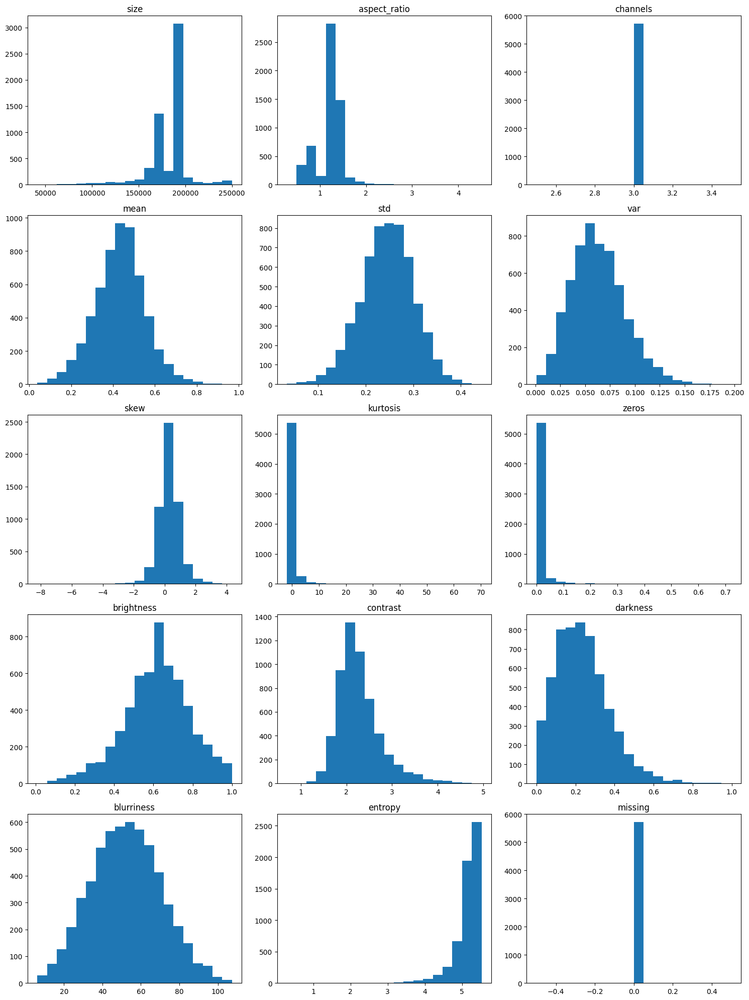

In [11]:
fig, axs = plt.subplots(5, 3, figsize=(15, 20))

for ax, metric in zip(
    axs.flat,
    [
        "size",
        "aspect_ratio",
        "channels",
        "mean",
        "std",
        "var",
        "skew",
        "kurtosis",
        "zeros",
        "brightness",
        "contrast",
        "darkness",
        "blurriness",
        "entropy",
        "missing",
    ],
):
    # Plot the histogram for the chosen metric
    ax.hist(dataset_stats[metric], bins=20)
    ax.set_title(metric)

plt.tight_layout()
plt.show()

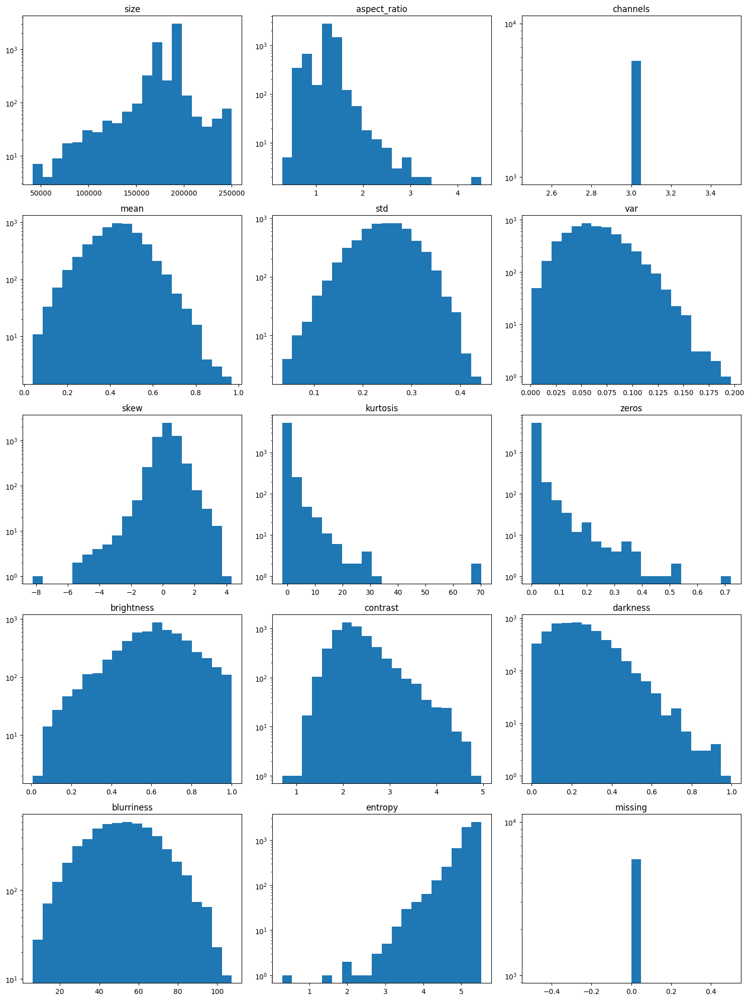

In [12]:
fig, axs = plt.subplots(5, 3, figsize=(15, 20))

for ax, metric in zip(
    axs.flat,
    [
        "size",
        "aspect_ratio",
        "channels",
        "mean",
        "std",
        "var",
        "skew",
        "kurtosis",
        "zeros",
        "brightness",
        "contrast",
        "darkness",
        "blurriness",
        "entropy",
        "missing",
    ],
):
    # Plot the histogram on a log scale for the chosen metric
    ax.hist(dataset_stats[metric], bins=20, log=True)
    ax.set_title(metric)

plt.tight_layout()
plt.show()

In [13]:
# This cell takes about 1-3 minutes to run depending on your hardware

# Calculate the per-channel pixelstats and visualstats for the images
# Note: the stat functions expect the images as an iterable and in the (C,H,W) format
ch_stats = channelstats(img_list)

# Aggregate all of the results in a single dictionary
ds_channel_stats = ch_stats.dict()

# View the list of metrics in the channel stats class
list(ds_channel_stats)

  0%|                                                                                          | 0/5717 [00:00<?, ?it/s]

  0%|                                                                                  | 1/5717 [00:00<15:46,  6.04it/s]

  0%|▎                                                                                | 19/5717 [00:00<01:22, 69.41it/s]

  1%|▌                                                                                | 37/5717 [00:00<01:03, 89.42it/s]

  1%|▊                                                                               | 54/5717 [00:00<00:54, 103.63it/s]

  1%|▉                                                                               | 65/5717 [00:00<00:54, 103.45it/s]

  1%|█                                                                                | 76/5717 [00:00<00:58, 95.76it/s]

  2%|█▎                                                                               | 91/5717 [00:00<00:56, 99.49it/s]

  2%|█▌                                                                             | 109/5717 [00:01<00:47, 119.20it/s]

  2%|█▋                                                                             | 122/5717 [00:01<00:49, 112.87it/s]

  2%|█▊                                                                             | 134/5717 [00:01<00:51, 108.04it/s]

  3%|██                                                                             | 150/5717 [00:01<00:46, 120.36it/s]

  3%|██▎                                                                            | 165/5717 [00:01<00:54, 101.65it/s]

  3%|██▋                                                                            | 193/5717 [00:01<00:44, 124.35it/s]

  4%|██▉                                                                            | 212/5717 [00:01<00:41, 132.22it/s]

  4%|███▏                                                                           | 228/5717 [00:02<00:41, 133.70it/s]

  4%|███▎                                                                           | 242/5717 [00:02<00:45, 121.47it/s]

  4%|███▌                                                                           | 255/5717 [00:02<00:52, 103.97it/s]

  5%|███▋                                                                           | 268/5717 [00:02<00:50, 108.52it/s]

  5%|███▉                                                                           | 284/5717 [00:02<00:47, 114.84it/s]

  5%|████▏                                                                          | 300/5717 [00:02<00:44, 120.41it/s]

  5%|████▎                                                                          | 313/5717 [00:02<00:45, 119.87it/s]

  6%|████▌                                                                          | 326/5717 [00:02<00:45, 118.25it/s]

  6%|████▋                                                                          | 338/5717 [00:03<00:51, 104.02it/s]

  6%|████▉                                                                          | 358/5717 [00:03<00:42, 127.22it/s]

  7%|█████▏                                                                         | 372/5717 [00:03<00:42, 127.12it/s]

  7%|█████▎                                                                         | 386/5717 [00:03<00:43, 121.68it/s]

  7%|█████▌                                                                         | 399/5717 [00:03<00:47, 113.05it/s]

  7%|█████▋                                                                         | 411/5717 [00:03<00:46, 113.58it/s]

  8%|█████▉                                                                         | 430/5717 [00:03<00:42, 125.57it/s]

  8%|██████                                                                         | 443/5717 [00:03<00:42, 124.29it/s]

  8%|██████▎                                                                        | 458/5717 [00:04<00:41, 128.27it/s]

  8%|██████▌                                                                        | 473/5717 [00:04<00:39, 133.56it/s]

  9%|██████▋                                                                        | 487/5717 [00:04<00:41, 127.31it/s]

  9%|██████▉                                                                        | 500/5717 [00:04<00:41, 124.62it/s]

  9%|███████                                                                        | 513/5717 [00:04<00:42, 121.99it/s]

  9%|███████▎                                                                       | 526/5717 [00:04<00:42, 121.23it/s]

  9%|███████▍                                                                       | 539/5717 [00:04<00:42, 121.67it/s]

 10%|███████▋                                                                       | 552/5717 [00:04<00:42, 121.87it/s]

 10%|███████▊                                                                       | 565/5717 [00:04<00:42, 120.62it/s]

 10%|████████                                                                       | 580/5717 [00:05<00:41, 123.63it/s]

 10%|████████▏                                                                      | 594/5717 [00:05<00:43, 116.49it/s]

 11%|████████▍                                                                      | 609/5717 [00:05<00:41, 122.05it/s]

 11%|████████▌                                                                      | 624/5717 [00:05<00:42, 121.01it/s]

 11%|████████▊                                                                      | 639/5717 [00:05<00:42, 120.42it/s]

 11%|█████████                                                                      | 655/5717 [00:05<00:41, 121.19it/s]

 12%|█████████▏                                                                     | 668/5717 [00:05<00:41, 122.87it/s]

 12%|█████████▍                                                                     | 681/5717 [00:05<00:40, 123.53it/s]

 12%|█████████▌                                                                     | 694/5717 [00:05<00:41, 120.77it/s]

 12%|█████████▊                                                                     | 707/5717 [00:06<00:41, 120.91it/s]

 13%|█████████▉                                                                     | 723/5717 [00:06<00:39, 125.26it/s]

 13%|██████████▏                                                                    | 738/5717 [00:06<00:38, 129.16it/s]

 13%|██████████▍                                                                    | 751/5717 [00:06<00:38, 128.86it/s]

 13%|██████████▌                                                                    | 764/5717 [00:06<00:38, 128.67it/s]

 14%|██████████▋                                                                    | 777/5717 [00:06<00:43, 114.51it/s]

 14%|██████████▉                                                                    | 789/5717 [00:06<00:42, 114.81it/s]

 14%|███████████                                                                    | 801/5717 [00:06<00:42, 115.46it/s]

 14%|███████████▎                                                                   | 815/5717 [00:06<00:42, 115.83it/s]

 15%|███████████▍                                                                   | 829/5717 [00:07<00:40, 121.48it/s]

 15%|███████████▋                                                                   | 842/5717 [00:07<00:44, 109.79it/s]

 15%|███████████▊                                                                   | 857/5717 [00:07<00:41, 117.00it/s]

 15%|████████████                                                                   | 872/5717 [00:07<00:39, 123.17it/s]

 15%|████████████▏                                                                  | 886/5717 [00:07<00:40, 119.18it/s]

 16%|████████████▍                                                                  | 899/5717 [00:07<00:40, 119.23it/s]

 16%|████████████▌                                                                  | 913/5717 [00:07<00:41, 115.02it/s]

 16%|████████████▊                                                                  | 926/5717 [00:07<00:42, 113.30it/s]

 16%|████████████▉                                                                  | 938/5717 [00:08<00:42, 111.39it/s]

 17%|█████████████▏                                                                 | 957/5717 [00:08<00:37, 126.15it/s]

 17%|█████████████▍                                                                 | 971/5717 [00:08<00:36, 128.49it/s]

 17%|█████████████▌                                                                 | 984/5717 [00:08<00:41, 114.60it/s]

 17%|█████████████▋                                                                | 1000/5717 [00:08<00:38, 121.32it/s]

 18%|█████████████▉                                                                | 1017/5717 [00:08<00:38, 122.30it/s]

 18%|██████████████                                                                | 1030/5717 [00:08<00:40, 115.25it/s]

 18%|██████████████▎                                                               | 1047/5717 [00:08<00:37, 123.78it/s]

 19%|██████████████▍                                                               | 1060/5717 [00:09<00:38, 120.92it/s]

 19%|██████████████▋                                                               | 1073/5717 [00:09<00:40, 115.92it/s]

 19%|██████████████▊                                                               | 1086/5717 [00:09<00:39, 117.74it/s]

 19%|███████████████                                                               | 1101/5717 [00:09<00:39, 116.27it/s]

 20%|███████████████▏                                                              | 1117/5717 [00:09<00:36, 125.25it/s]

 20%|███████████████▍                                                              | 1130/5717 [00:09<00:36, 126.16it/s]

 20%|███████████████▌                                                              | 1143/5717 [00:09<00:37, 121.72it/s]

 20%|███████████████▊                                                              | 1157/5717 [00:09<00:38, 119.23it/s]

 20%|███████████████▉                                                              | 1171/5717 [00:09<00:40, 111.11it/s]

 21%|████████████████▏                                                             | 1187/5717 [00:10<00:37, 119.60it/s]

 21%|████████████████▍                                                             | 1204/5717 [00:10<00:36, 123.91it/s]

 21%|████████████████▋                                                             | 1221/5717 [00:10<00:35, 126.31it/s]

 22%|████████████████▉                                                             | 1239/5717 [00:10<00:32, 135.98it/s]

 22%|█████████████████                                                             | 1253/5717 [00:10<00:34, 131.16it/s]

 22%|█████████████████▎                                                            | 1267/5717 [00:10<00:35, 126.76it/s]

 22%|█████████████████▍                                                            | 1280/5717 [00:10<00:36, 122.47it/s]

 23%|█████████████████▋                                                            | 1293/5717 [00:10<00:36, 120.21it/s]

 23%|█████████████████▊                                                            | 1306/5717 [00:11<00:37, 116.36it/s]

 23%|██████████████████                                                            | 1323/5717 [00:11<00:37, 118.46it/s]

 23%|██████████████████▏                                                           | 1335/5717 [00:11<00:37, 117.36it/s]

 24%|██████████████████▍                                                           | 1351/5717 [00:11<00:35, 124.59it/s]

 24%|██████████████████▋                                                           | 1367/5717 [00:11<00:35, 122.00it/s]

 24%|██████████████████▊                                                           | 1381/5717 [00:11<00:35, 123.19it/s]

 24%|███████████████████                                                           | 1394/5717 [00:11<00:35, 123.25it/s]

 25%|███████████████████▏                                                          | 1407/5717 [00:11<00:35, 122.93it/s]

 25%|███████████████████▍                                                          | 1421/5717 [00:12<00:37, 113.78it/s]

 25%|███████████████████▌                                                          | 1437/5717 [00:12<00:36, 118.68it/s]

 25%|███████████████████▊                                                          | 1454/5717 [00:12<00:34, 122.89it/s]

 26%|████████████████████                                                          | 1467/5717 [00:12<00:35, 118.23it/s]

 26%|████████████████████▏                                                         | 1479/5717 [00:12<00:37, 114.14it/s]

 26%|████████████████████▍                                                         | 1497/5717 [00:12<00:33, 124.75it/s]

 26%|████████████████████▌                                                         | 1510/5717 [00:12<00:33, 125.31it/s]

 27%|████████████████████▊                                                         | 1523/5717 [00:12<00:35, 117.05it/s]

 27%|████████████████████▉                                                         | 1538/5717 [00:12<00:35, 116.88it/s]

 27%|█████████████████████▏                                                        | 1550/5717 [00:13<00:36, 115.55it/s]

 27%|█████████████████████▎                                                        | 1562/5717 [00:13<00:36, 115.26it/s]

 28%|█████████████████████▌                                                        | 1577/5717 [00:13<00:33, 123.49it/s]

 28%|█████████████████████▋                                                        | 1590/5717 [00:13<00:33, 123.07it/s]

 28%|█████████████████████▊                                                        | 1603/5717 [00:13<00:33, 121.04it/s]

 28%|██████████████████████                                                        | 1618/5717 [00:13<00:31, 128.59it/s]

 29%|██████████████████████▎                                                       | 1631/5717 [00:13<00:37, 108.92it/s]

 29%|██████████████████████▍                                                       | 1647/5717 [00:13<00:33, 121.26it/s]

 29%|██████████████████████▋                                                       | 1660/5717 [00:14<00:37, 107.96it/s]

 29%|██████████████████████▉                                                       | 1677/5717 [00:14<00:33, 120.64it/s]

 30%|███████████████████████                                                       | 1691/5717 [00:14<00:33, 120.48it/s]

 30%|███████████████████████▎                                                      | 1705/5717 [00:14<00:32, 124.72it/s]

 30%|███████████████████████▍                                                      | 1721/5717 [00:14<00:32, 122.68it/s]

 30%|███████████████████████▋                                                      | 1738/5717 [00:14<00:30, 130.93it/s]

 31%|███████████████████████▉                                                      | 1752/5717 [00:14<00:31, 124.58it/s]

 31%|████████████████████████                                                      | 1766/5717 [00:14<00:31, 124.72it/s]

 31%|████████████████████████▎                                                     | 1781/5717 [00:14<00:31, 126.62it/s]

 31%|████████████████████████▌                                                     | 1796/5717 [00:15<00:30, 130.49it/s]

 32%|████████████████████████▋                                                     | 1810/5717 [00:15<00:31, 124.03it/s]

 32%|████████████████████████▉                                                     | 1824/5717 [00:15<00:31, 123.13it/s]

 32%|█████████████████████████                                                     | 1839/5717 [00:15<00:32, 118.06it/s]

 32%|█████████████████████████▎                                                    | 1853/5717 [00:15<00:31, 122.65it/s]

 33%|█████████████████████████▍                                                    | 1866/5717 [00:15<00:31, 123.19it/s]

 33%|█████████████████████████▋                                                    | 1880/5717 [00:15<00:32, 119.70it/s]

 33%|█████████████████████████▊                                                    | 1894/5717 [00:15<00:32, 117.12it/s]

 33%|██████████████████████████                                                    | 1906/5717 [00:16<00:33, 112.32it/s]

 34%|██████████████████████████▎                                                   | 1924/5717 [00:16<00:30, 122.72it/s]

 34%|██████████████████████████▍                                                   | 1941/5717 [00:16<00:34, 110.48it/s]

 34%|██████████████████████████▋                                                   | 1958/5717 [00:16<00:30, 123.95it/s]

 35%|██████████████████████████▉                                                   | 1975/5717 [00:16<00:28, 132.55it/s]

 35%|███████████████████████████▏                                                  | 1990/5717 [00:16<00:27, 134.25it/s]

 35%|███████████████████████████▎                                                  | 2004/5717 [00:16<00:30, 120.10it/s]

 35%|███████████████████████████▌                                                  | 2018/5717 [00:16<00:31, 118.48it/s]

 36%|███████████████████████████▊                                                  | 2034/5717 [00:17<00:31, 118.60it/s]

 36%|███████████████████████████▉                                                  | 2048/5717 [00:17<00:29, 122.72it/s]

 36%|████████████████████████████                                                  | 2061/5717 [00:17<00:30, 118.49it/s]

 36%|████████████████████████████▎                                                 | 2077/5717 [00:17<00:30, 118.18it/s]

 37%|████████████████████████████▌                                                 | 2091/5717 [00:17<00:29, 121.26it/s]

 37%|████████████████████████████▋                                                 | 2106/5717 [00:17<00:28, 126.68it/s]

 37%|████████████████████████████▉                                                 | 2119/5717 [00:17<00:28, 126.18it/s]

 37%|█████████████████████████████▏                                                | 2135/5717 [00:17<00:30, 117.94it/s]

 38%|█████████████████████████████▎                                                | 2148/5717 [00:17<00:29, 119.08it/s]

 38%|█████████████████████████████▍                                                | 2161/5717 [00:18<00:29, 120.78it/s]

 38%|█████████████████████████████▋                                                | 2174/5717 [00:18<00:29, 119.73it/s]

 38%|█████████████████████████████▊                                                | 2188/5717 [00:18<00:31, 113.31it/s]

 38%|██████████████████████████████                                                | 2200/5717 [00:18<00:31, 113.34it/s]

 39%|██████████████████████████████▏                                               | 2212/5717 [00:18<00:32, 108.37it/s]

 39%|██████████████████████████████▍                                               | 2229/5717 [00:18<00:29, 120.04it/s]

 39%|██████████████████████████████▋                                               | 2245/5717 [00:18<00:27, 125.15it/s]

 40%|██████████████████████████████▊                                               | 2259/5717 [00:18<00:27, 127.39it/s]

 40%|██████████████████████████████▉                                               | 2272/5717 [00:19<00:27, 125.53it/s]

 40%|███████████████████████████████▏                                              | 2285/5717 [00:19<00:28, 120.58it/s]

 40%|███████████████████████████████▍                                              | 2301/5717 [00:19<00:27, 126.21it/s]

 40%|███████████████████████████████▌                                              | 2315/5717 [00:19<00:26, 127.57it/s]

 41%|███████████████████████████████▊                                              | 2328/5717 [00:19<00:28, 120.87it/s]

 41%|███████████████████████████████▉                                              | 2341/5717 [00:19<00:30, 111.76it/s]

 41%|████████████████████████████████▏                                             | 2356/5717 [00:19<00:28, 116.75it/s]

 41%|████████████████████████████████▎                                             | 2368/5717 [00:19<00:28, 116.74it/s]

 42%|████████████████████████████████▌                                             | 2383/5717 [00:19<00:26, 124.54it/s]

 42%|████████████████████████████████▋                                             | 2396/5717 [00:20<00:27, 118.83it/s]

 42%|████████████████████████████████▉                                             | 2411/5717 [00:20<00:26, 124.27it/s]

 42%|█████████████████████████████████                                             | 2424/5717 [00:20<00:26, 125.15it/s]

 43%|█████████████████████████████████▎                                            | 2441/5717 [00:20<00:27, 119.77it/s]

 43%|█████████████████████████████████▌                                            | 2458/5717 [00:20<00:25, 128.45it/s]

 43%|█████████████████████████████████▋                                            | 2472/5717 [00:20<00:25, 126.96it/s]

 43%|█████████████████████████████████▉                                            | 2485/5717 [00:20<00:25, 125.36it/s]

 44%|██████████████████████████████████                                            | 2498/5717 [00:20<00:28, 112.80it/s]

 44%|██████████████████████████████████▎                                           | 2515/5717 [00:21<00:27, 116.79it/s]

 44%|██████████████████████████████████▌                                           | 2532/5717 [00:21<00:24, 129.37it/s]

 45%|██████████████████████████████████▊                                           | 2547/5717 [00:21<00:25, 126.58it/s]

 45%|██████████████████████████████████▉                                           | 2561/5717 [00:21<00:24, 129.40it/s]

 45%|███████████████████████████████████▏                                          | 2577/5717 [00:21<00:23, 135.41it/s]

 45%|███████████████████████████████████▎                                          | 2591/5717 [00:21<00:24, 129.05it/s]

 46%|███████████████████████████████████▌                                          | 2605/5717 [00:21<00:24, 125.50it/s]

 46%|███████████████████████████████████▋                                          | 2618/5717 [00:21<00:26, 118.73it/s]

 46%|███████████████████████████████████▉                                          | 2632/5717 [00:21<00:26, 114.33it/s]

 46%|████████████████████████████████████▏                                         | 2649/5717 [00:22<00:23, 128.59it/s]

 47%|████████████████████████████████████▎                                         | 2663/5717 [00:22<00:24, 126.07it/s]

 47%|████████████████████████████████████▌                                         | 2676/5717 [00:22<00:26, 113.81it/s]

 47%|████████████████████████████████████▊                                         | 2694/5717 [00:22<00:24, 123.28it/s]

 47%|████████████████████████████████████▉                                         | 2711/5717 [00:22<00:24, 122.86it/s]

 48%|█████████████████████████████████████▏                                        | 2724/5717 [00:22<00:24, 120.11it/s]

 48%|█████████████████████████████████████▍                                        | 2740/5717 [00:22<00:23, 124.74it/s]

 48%|█████████████████████████████████████▌                                        | 2753/5717 [00:22<00:23, 126.08it/s]

 48%|█████████████████████████████████████▋                                        | 2766/5717 [00:23<00:23, 125.06it/s]

 49%|█████████████████████████████████████▉                                        | 2779/5717 [00:23<00:23, 122.66it/s]

 49%|██████████████████████████████████████                                        | 2792/5717 [00:23<00:24, 118.20it/s]

 49%|██████████████████████████████████████▎                                       | 2804/5717 [00:23<00:25, 115.98it/s]

 49%|██████████████████████████████████████▍                                       | 2820/5717 [00:23<00:24, 117.45it/s]

 50%|██████████████████████████████████████▋                                       | 2838/5717 [00:23<00:21, 133.52it/s]

 50%|██████████████████████████████████████▉                                       | 2852/5717 [00:23<00:24, 117.45it/s]

 50%|███████████████████████████████████████                                       | 2865/5717 [00:23<00:24, 117.38it/s]

 50%|███████████████████████████████████████▎                                      | 2878/5717 [00:24<00:24, 115.96it/s]

 51%|███████████████████████████████████████▍                                      | 2891/5717 [00:24<00:24, 114.31it/s]

 51%|███████████████████████████████████████▋                                      | 2906/5717 [00:24<00:23, 121.42it/s]

 51%|███████████████████████████████████████▊                                      | 2919/5717 [00:24<00:23, 116.65it/s]

 51%|███████████████████████████████████████▉                                      | 2931/5717 [00:24<00:24, 111.90it/s]

 51%|████████████████████████████████████████▋                                      | 2943/5717 [00:24<00:31, 87.47it/s]

 52%|████████████████████████████████████████▍                                     | 2964/5717 [00:24<00:24, 113.91it/s]

 52%|████████████████████████████████████████▌                                     | 2977/5717 [00:24<00:25, 107.85it/s]

 52%|████████████████████████████████████████▊                                     | 2989/5717 [00:25<00:24, 110.30it/s]

 52%|████████████████████████████████████████▉                                     | 3001/5717 [00:25<00:24, 112.54it/s]

 53%|█████████████████████████████████████████▋                                     | 3013/5717 [00:25<00:28, 95.10it/s]

 53%|█████████████████████████████████████████▎                                    | 3029/5717 [00:25<00:24, 108.49it/s]

 53%|█████████████████████████████████████████▍                                    | 3041/5717 [00:25<00:24, 111.20it/s]

 53%|█████████████████████████████████████████▋                                    | 3055/5717 [00:25<00:23, 112.32it/s]

 54%|█████████████████████████████████████████▉                                    | 3071/5717 [00:25<00:22, 119.61it/s]

 54%|██████████████████████████████████████████                                    | 3084/5717 [00:25<00:24, 109.56it/s]

 54%|██████████████████████████████████████████▎                                   | 3102/5717 [00:25<00:20, 126.84it/s]

 55%|██████████████████████████████████████████▌                                   | 3116/5717 [00:26<00:22, 116.02it/s]

 55%|██████████████████████████████████████████▋                                   | 3129/5717 [00:26<00:21, 119.07it/s]

 55%|██████████████████████████████████████████▊                                   | 3142/5717 [00:26<00:21, 119.71it/s]

 55%|███████████████████████████████████████████                                   | 3158/5717 [00:26<00:21, 120.69it/s]

 56%|███████████████████████████████████████████▎                                  | 3175/5717 [00:26<00:19, 131.54it/s]

 56%|███████████████████████████████████████████▌                                  | 3189/5717 [00:26<00:21, 117.94it/s]

 56%|███████████████████████████████████████████▋                                  | 3202/5717 [00:26<00:21, 118.15it/s]

 56%|███████████████████████████████████████████▉                                  | 3219/5717 [00:27<00:23, 107.17it/s]

 57%|████████████████████████████████████████████▏                                 | 3237/5717 [00:27<00:20, 121.49it/s]

 57%|████████████████████████████████████████████▎                                 | 3252/5717 [00:27<00:19, 128.13it/s]

 57%|████████████████████████████████████████████▌                                 | 3266/5717 [00:27<00:19, 128.69it/s]

 57%|████████████████████████████████████████████▊                                 | 3280/5717 [00:27<00:20, 119.83it/s]

 58%|████████████████████████████████████████████▉                                 | 3296/5717 [00:27<00:19, 127.00it/s]

 58%|█████████████████████████████████████████████▏                                | 3311/5717 [00:27<00:18, 126.95it/s]

 58%|█████████████████████████████████████████████▍                                | 3328/5717 [00:27<00:18, 129.13it/s]

 58%|█████████████████████████████████████████████▌                                | 3342/5717 [00:28<00:20, 115.06it/s]

 59%|█████████████████████████████████████████████▊                                | 3357/5717 [00:28<00:19, 119.29it/s]

 59%|██████████████████████████████████████████████                                | 3374/5717 [00:28<00:17, 130.68it/s]

 59%|██████████████████████████████████████████████▏                               | 3388/5717 [00:28<00:20, 113.45it/s]

 60%|██████████████████████████████████████████████▍                               | 3405/5717 [00:28<00:18, 126.78it/s]

 60%|██████████████████████████████████████████████▋                               | 3419/5717 [00:28<00:18, 125.79it/s]

 60%|██████████████████████████████████████████████▊                               | 3433/5717 [00:28<00:18, 124.21it/s]

 60%|███████████████████████████████████████████████                               | 3446/5717 [00:28<00:19, 116.36it/s]

 60%|███████████████████████████████████████████████▏                              | 3458/5717 [00:28<00:21, 104.40it/s]

 61%|███████████████████████████████████████████████▎                              | 3471/5717 [00:29<00:20, 108.31it/s]

 61%|███████████████████████████████████████████████▌                              | 3483/5717 [00:29<00:22, 100.29it/s]

 61%|███████████████████████████████████████████████▋                              | 3498/5717 [00:29<00:19, 112.48it/s]

 61%|███████████████████████████████████████████████▉                              | 3510/5717 [00:29<00:19, 111.74it/s]

 62%|████████████████████████████████████████████████▋                              | 3522/5717 [00:29<00:23, 93.72it/s]

 62%|████████████████████████████████████████████████▎                             | 3538/5717 [00:29<00:20, 107.88it/s]

 62%|████████████████████████████████████████████████▍                             | 3554/5717 [00:29<00:18, 120.15it/s]

 62%|████████████████████████████████████████████████▋                             | 3567/5717 [00:29<00:19, 109.22it/s]

 63%|████████████████████████████████████████████████▊                             | 3579/5717 [00:30<00:19, 109.43it/s]

 63%|█████████████████████████████████████████████████                             | 3592/5717 [00:30<00:19, 111.35it/s]

 63%|█████████████████████████████████████████████████▏                            | 3604/5717 [00:30<00:19, 110.26it/s]

 63%|█████████████████████████████████████████████████▎                            | 3617/5717 [00:30<00:18, 112.08it/s]

 63%|█████████████████████████████████████████████████▌                            | 3629/5717 [00:30<00:18, 110.55it/s]

 64%|█████████████████████████████████████████████████▋                            | 3643/5717 [00:30<00:19, 107.78it/s]

 64%|█████████████████████████████████████████████████▊                            | 3655/5717 [00:30<00:19, 105.19it/s]

 64%|██████████████████████████████████████████████████                            | 3669/5717 [00:30<00:18, 110.78it/s]

 64%|██████████████████████████████████████████████████▏                           | 3681/5717 [00:31<00:19, 106.58it/s]

 65%|███████████████████████████████████████████████████                            | 3692/5717 [00:31<00:20, 99.65it/s]

 65%|██████████████████████████████████████████████████▌                           | 3710/5717 [00:31<00:16, 119.84it/s]

 65%|██████████████████████████████████████████████████▊                           | 3723/5717 [00:31<00:17, 115.82it/s]

 65%|██████████████████████████████████████████████████▉                           | 3738/5717 [00:31<00:16, 121.61it/s]

 66%|███████████████████████████████████████████████████▏                          | 3754/5717 [00:31<00:15, 128.14it/s]

 66%|███████████████████████████████████████████████████▍                          | 3767/5717 [00:31<00:16, 116.18it/s]

 66%|███████████████████████████████████████████████████▌                          | 3779/5717 [00:31<00:18, 106.32it/s]

 66%|███████████████████████████████████████████████████▊                          | 3797/5717 [00:32<00:17, 112.72it/s]

 67%|████████████████████████████████████████████████████                          | 3815/5717 [00:32<00:15, 124.52it/s]

 67%|████████████████████████████████████████████████████▏                         | 3828/5717 [00:32<00:15, 125.55it/s]

 67%|████████████████████████████████████████████████████▍                         | 3841/5717 [00:32<00:16, 113.72it/s]

 67%|████████████████████████████████████████████████████▋                         | 3858/5717 [00:32<00:15, 122.29it/s]

 68%|████████████████████████████████████████████████████▊                         | 3874/5717 [00:32<00:14, 124.48it/s]

 68%|█████████████████████████████████████████████████████                         | 3887/5717 [00:32<00:14, 122.09it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3900/5717 [00:32<00:14, 121.43it/s]

 68%|█████████████████████████████████████████████████████▍                        | 3913/5717 [00:33<00:16, 111.40it/s]

 69%|█████████████████████████████████████████████████████▌                        | 3925/5717 [00:33<00:16, 110.74it/s]

 69%|█████████████████████████████████████████████████████▋                        | 3937/5717 [00:33<00:16, 110.67it/s]

 69%|█████████████████████████████████████████████████████▉                        | 3950/5717 [00:33<00:15, 113.54it/s]

 69%|██████████████████████████████████████████████████████                        | 3962/5717 [00:33<00:15, 113.72it/s]

 70%|██████████████████████████████████████████████████████▏                       | 3974/5717 [00:33<00:17, 100.05it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3986/5717 [00:33<00:17, 100.76it/s]

 70%|███████████████████████████████████████████████████████▏                       | 3998/5717 [00:33<00:17, 99.54it/s]

 70%|██████████████████████████████████████████████████████▋                       | 4010/5717 [00:33<00:16, 103.55it/s]

 70%|██████████████████████████████████████████████████████▉                       | 4024/5717 [00:34<00:16, 105.23it/s]

 71%|███████████████████████████████████████████████████████                       | 4038/5717 [00:34<00:15, 106.90it/s]

 71%|███████████████████████████████████████████████████████▏                      | 4049/5717 [00:34<00:15, 105.29it/s]

 71%|███████████████████████████████████████████████████████▍                      | 4062/5717 [00:34<00:15, 105.29it/s]

 71%|███████████████████████████████████████████████████████▋                      | 4080/5717 [00:34<00:13, 121.83it/s]

 72%|███████████████████████████████████████████████████████▊                      | 4094/5717 [00:34<00:12, 126.65it/s]

 72%|████████████████████████████████████████████████████████                      | 4107/5717 [00:34<00:13, 122.82it/s]

 72%|████████████████████████████████████████████████████████▏                     | 4120/5717 [00:34<00:14, 113.04it/s]

 72%|████████████████████████████████████████████████████████▍                     | 4133/5717 [00:35<00:15, 104.57it/s]

 73%|████████████████████████████████████████████████████████▋                     | 4151/5717 [00:35<00:13, 115.77it/s]

 73%|████████████████████████████████████████████████████████▊                     | 4167/5717 [00:35<00:13, 115.35it/s]

 73%|█████████████████████████████████████████████████████████                     | 4181/5717 [00:35<00:12, 121.13it/s]

 73%|█████████████████████████████████████████████████████████▏                    | 4194/5717 [00:35<00:13, 114.69it/s]

 74%|█████████████████████████████████████████████████████████▍                    | 4206/5717 [00:35<00:13, 108.50it/s]

 74%|█████████████████████████████████████████████████████████▌                    | 4220/5717 [00:35<00:13, 110.03it/s]

 74%|█████████████████████████████████████████████████████████▊                    | 4238/5717 [00:35<00:11, 125.48it/s]

 74%|█████████████████████████████████████████████████████████▉                    | 4251/5717 [00:36<00:12, 119.36it/s]

 75%|██████████████████████████████████████████████████████████▏                   | 4264/5717 [00:36<00:12, 115.88it/s]

 75%|██████████████████████████████████████████████████████████▎                   | 4276/5717 [00:36<00:13, 109.10it/s]

 75%|██████████████████████████████████████████████████████████▌                   | 4292/5717 [00:36<00:11, 121.10it/s]

 75%|██████████████████████████████████████████████████████████▋                   | 4305/5717 [00:36<00:12, 116.02it/s]

 76%|██████████████████████████████████████████████████████████▉                   | 4322/5717 [00:36<00:11, 122.22it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 4335/5717 [00:36<00:11, 115.46it/s]

 76%|███████████████████████████████████████████████████████████▎                  | 4349/5717 [00:36<00:12, 109.95it/s]

 76%|███████████████████████████████████████████████████████████▌                  | 4369/5717 [00:37<00:11, 122.12it/s]

 77%|███████████████████████████████████████████████████████████▊                  | 4382/5717 [00:37<00:11, 118.38it/s]

 77%|███████████████████████████████████████████████████████████▉                  | 4395/5717 [00:37<00:11, 113.00it/s]

 77%|████████████████████████████████████████████████████████████▏                 | 4410/5717 [00:37<00:11, 115.62it/s]

 77%|████████████████████████████████████████████████████████████▍                 | 4427/5717 [00:37<00:10, 121.75it/s]

 78%|████████████████████████████████████████████████████████████▌                 | 4440/5717 [00:37<00:10, 120.07it/s]

 78%|████████████████████████████████████████████████████████████▊                 | 4453/5717 [00:37<00:11, 110.38it/s]

 78%|████████████████████████████████████████████████████████████▉                 | 4465/5717 [00:37<00:11, 105.79it/s]

 78%|█████████████████████████████████████████████████████████████                 | 4476/5717 [00:37<00:11, 106.26it/s]

 78%|██████████████████████████████████████████████████████████████                 | 4487/5717 [00:38<00:12, 98.12it/s]

 79%|██████████████████████████████████████████████████████████████▏                | 4499/5717 [00:38<00:12, 94.74it/s]

 79%|█████████████████████████████████████████████████████████████▌                | 4514/5717 [00:38<00:11, 108.10it/s]

 79%|██████████████████████████████████████████████████████████████▌                | 4526/5717 [00:38<00:12, 96.48it/s]

 79%|█████████████████████████████████████████████████████████████▉                | 4539/5717 [00:38<00:11, 104.48it/s]

 80%|██████████████████████████████████████████████████████████████                | 4552/5717 [00:38<00:10, 107.84it/s]

 80%|██████████████████████████████████████████████████████████████▎               | 4564/5717 [00:38<00:11, 103.05it/s]

 80%|██████████████████████████████████████████████████████████████▌               | 4582/5717 [00:39<00:10, 108.17it/s]

 80%|██████████████████████████████████████████████████████████████▋               | 4593/5717 [00:39<00:10, 105.03it/s]

 81%|██████████████████████████████████████████████████████████████▊               | 4604/5717 [00:39<00:11, 100.48it/s]

 81%|██████████████████████████████████████████████████████████████▉               | 4617/5717 [00:39<00:10, 107.77it/s]

 81%|███████████████████████████████████████████████████████████████▏              | 4628/5717 [00:39<00:10, 102.79it/s]

 81%|███████████████████████████████████████████████████████████████▎              | 4639/5717 [00:39<00:10, 103.61it/s]

 81%|███████████████████████████████████████████████████████████████▍              | 4652/5717 [00:39<00:09, 110.17it/s]

 82%|███████████████████████████████████████████████████████████████▋              | 4664/5717 [00:39<00:09, 105.89it/s]

 82%|███████████████████████████████████████████████████████████████▊              | 4677/5717 [00:39<00:09, 105.04it/s]

 82%|███████████████████████████████████████████████████████████████▉              | 4690/5717 [00:40<00:09, 108.48it/s]

 82%|████████████████████████████████████████████████████████████████▏             | 4704/5717 [00:40<00:09, 112.49it/s]

 82%|████████████████████████████████████████████████████████████████▎             | 4716/5717 [00:40<00:08, 113.46it/s]

 83%|████████████████████████████████████████████████████████████████▌             | 4728/5717 [00:40<00:09, 101.09it/s]

 83%|████████████████████████████████████████████████████████████████▋             | 4741/5717 [00:40<00:09, 102.68it/s]

 83%|█████████████████████████████████████████████████████████████████▋             | 4753/5717 [00:40<00:10, 93.39it/s]

 83%|█████████████████████████████████████████████████████████████████             | 4771/5717 [00:40<00:08, 113.39it/s]

 84%|█████████████████████████████████████████████████████████████████▎            | 4783/5717 [00:40<00:08, 114.73it/s]

 84%|██████████████████████████████████████████████████████████████████▎            | 4795/5717 [00:41<00:09, 95.36it/s]

 84%|█████████████████████████████████████████████████████████████████▋            | 4813/5717 [00:41<00:08, 107.64it/s]

 84%|█████████████████████████████████████████████████████████████████▊            | 4825/5717 [00:41<00:08, 108.82it/s]

 85%|██████████████████████████████████████████████████████████████████            | 4839/5717 [00:41<00:07, 113.79it/s]

 85%|███████████████████████████████████████████████████████████████████            | 4851/5717 [00:41<00:09, 94.95it/s]

 85%|██████████████████████████████████████████████████████████████████▎           | 4864/5717 [00:41<00:08, 101.89it/s]

 85%|██████████████████████████████████████████████████████████████████▌           | 4879/5717 [00:41<00:07, 111.73it/s]

 86%|██████████████████████████████████████████████████████████████████▋           | 4891/5717 [00:41<00:07, 103.37it/s]

 86%|██████████████████████████████████████████████████████████████████▉           | 4904/5717 [00:42<00:07, 109.55it/s]

 86%|███████████████████████████████████████████████████████████████████▏          | 4921/5717 [00:42<00:07, 113.30it/s]

 86%|███████████████████████████████████████████████████████████████████▎          | 4934/5717 [00:42<00:07, 109.19it/s]

 87%|███████████████████████████████████████████████████████████████████▍          | 4946/5717 [00:42<00:06, 110.47it/s]

 87%|███████████████████████████████████████████████████████████████████▋          | 4959/5717 [00:42<00:06, 108.33it/s]

 87%|███████████████████████████████████████████████████████████████████▊          | 4973/5717 [00:42<00:06, 110.89it/s]

 87%|████████████████████████████████████████████████████████████████████          | 4987/5717 [00:42<00:06, 117.22it/s]

 87%|████████████████████████████████████████████████████████████████████▏         | 5000/5717 [00:42<00:05, 119.71it/s]

 88%|████████████████████████████████████████████████████████████████████▍         | 5013/5717 [00:42<00:05, 121.83it/s]

 88%|████████████████████████████████████████████████████████████████████▌         | 5026/5717 [00:43<00:06, 112.42it/s]

 88%|████████████████████████████████████████████████████████████████████▋         | 5038/5717 [00:43<00:06, 111.58it/s]

 88%|████████████████████████████████████████████████████████████████████▉         | 5051/5717 [00:43<00:05, 113.44it/s]

 89%|█████████████████████████████████████████████████████████████████████         | 5063/5717 [00:43<00:06, 108.63it/s]

 89%|█████████████████████████████████████████████████████████████████████▏        | 5075/5717 [00:43<00:06, 106.99it/s]

 89%|█████████████████████████████████████████████████████████████████████▍        | 5087/5717 [00:43<00:06, 100.92it/s]

 89%|██████████████████████████████████████████████████████████████████████▍        | 5099/5717 [00:43<00:06, 96.74it/s]

 89%|█████████████████████████████████████████████████████████████████████▊        | 5116/5717 [00:43<00:05, 114.36it/s]

 90%|█████████████████████████████████████████████████████████████████████▉        | 5128/5717 [00:44<00:05, 106.56it/s]

 90%|██████████████████████████████████████████████████████████████████████▏       | 5141/5717 [00:44<00:05, 105.07it/s]

 90%|██████████████████████████████████████████████████████████████████████▎       | 5156/5717 [00:44<00:04, 116.23it/s]

 90%|██████████████████████████████████████████████████████████████████████▌       | 5168/5717 [00:44<00:05, 105.91it/s]

 91%|██████████████████████████████████████████████████████████████████████▋       | 5181/5717 [00:44<00:04, 109.40it/s]

 91%|██████████████████████████████████████████████████████████████████████▉       | 5196/5717 [00:44<00:04, 110.57it/s]

 91%|███████████████████████████████████████████████████████████████████████       | 5209/5717 [00:44<00:04, 102.25it/s]

 91%|███████████████████████████████████████████████████████████████████████▎      | 5223/5717 [00:44<00:04, 111.28it/s]

 92%|███████████████████████████████████████████████████████████████████████▍      | 5238/5717 [00:45<00:04, 111.49it/s]

 92%|███████████████████████████████████████████████████████████████████████▋      | 5250/5717 [00:45<00:04, 109.38it/s]

 92%|███████████████████████████████████████████████████████████████████████▊      | 5267/5717 [00:45<00:03, 115.96it/s]

 92%|████████████████████████████████████████████████████████████████████████      | 5282/5717 [00:45<00:03, 121.06it/s]

 93%|████████████████████████████████████████████████████████████████████████▏     | 5295/5717 [00:45<00:03, 116.72it/s]

 93%|████████████████████████████████████████████████████████████████████████▍     | 5307/5717 [00:45<00:03, 110.22it/s]

 93%|████████████████████████████████████████████████████████████████████████▌     | 5319/5717 [00:45<00:03, 106.05it/s]

 93%|█████████████████████████████████████████████████████████████████████████▋     | 5330/5717 [00:45<00:04, 96.15it/s]

 93%|████████████████████████████████████████████████████████████████████████▉     | 5343/5717 [00:46<00:03, 104.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████     | 5355/5717 [00:46<00:03, 106.17it/s]

 94%|█████████████████████████████████████████████████████████████████████████▏    | 5367/5717 [00:46<00:03, 108.21it/s]

 94%|█████████████████████████████████████████████████████████████████████████▍    | 5381/5717 [00:46<00:02, 115.97it/s]

 94%|█████████████████████████████████████████████████████████████████████████▌    | 5393/5717 [00:46<00:03, 102.35it/s]

 95%|█████████████████████████████████████████████████████████████████████████▊    | 5410/5717 [00:46<00:02, 114.10it/s]

 95%|██████████████████████████████████████████████████████████████████████████    | 5426/5717 [00:46<00:02, 117.91it/s]

 95%|██████████████████████████████████████████████████████████████████████████▏   | 5438/5717 [00:46<00:02, 115.32it/s]

 95%|██████████████████████████████████████████████████████████████████████████▍   | 5454/5717 [00:47<00:02, 121.05it/s]

 96%|██████████████████████████████████████████████████████████████████████████▌   | 5467/5717 [00:47<00:02, 115.62it/s]

 96%|██████████████████████████████████████████████████████████████████████████▊   | 5481/5717 [00:47<00:01, 119.01it/s]

 96%|██████████████████████████████████████████████████████████████████████████▉   | 5494/5717 [00:47<00:01, 116.52it/s]

 96%|███████████████████████████████████████████████████████████████████████████   | 5506/5717 [00:47<00:01, 109.10it/s]

 97%|███████████████████████████████████████████████████████████████████████████▎  | 5517/5717 [00:47<00:01, 100.80it/s]

 97%|███████████████████████████████████████████████████████████████████████████▍  | 5532/5717 [00:47<00:01, 109.39it/s]

 97%|███████████████████████████████████████████████████████████████████████████▋  | 5545/5717 [00:47<00:01, 110.92it/s]

 97%|████████████████████████████████████████████████████████████████████████████▊  | 5557/5717 [00:48<00:01, 94.13it/s]

 97%|████████████████████████████████████████████████████████████████████████████  | 5573/5717 [00:48<00:01, 106.77it/s]

 98%|████████████████████████████████████████████████████████████████████████████▏ | 5585/5717 [00:48<00:01, 106.89it/s]

 98%|████████████████████████████████████████████████████████████████████████████▍ | 5598/5717 [00:48<00:01, 110.26it/s]

 98%|████████████████████████████████████████████████████████████████████████████▌ | 5611/5717 [00:48<00:00, 115.30it/s]

 98%|████████████████████████████████████████████████████████████████████████████▋ | 5623/5717 [00:48<00:00, 109.37it/s]

 99%|████████████████████████████████████████████████████████████████████████████▉ | 5640/5717 [00:48<00:00, 117.19it/s]

 99%|█████████████████████████████████████████████████████████████████████████████▏| 5653/5717 [00:48<00:00, 114.08it/s]

 99%|█████████████████████████████████████████████████████████████████████████████▎| 5670/5717 [00:48<00:00, 120.48it/s]

 99%|█████████████████████████████████████████████████████████████████████████████▌| 5683/5717 [00:49<00:00, 113.67it/s]

100%|█████████████████████████████████████████████████████████████████████████████▋| 5697/5717 [00:49<00:00, 115.58it/s]

100%|█████████████████████████████████████████████████████████████████████████████▉| 5710/5717 [00:49<00:00, 116.98it/s]

100%|██████████████████████████████████████████████████████████████████████████████| 5717/5717 [00:49<00:00, 115.87it/s]

['source_index',
 'box_count',
 'mean',
 'std',
 'var',
 'skew',
 'kurtosis',
 'histogram',
 'entropy',
 'brightness',
 'blurriness',
 'contrast',
 'darkness',
 'missing',
 'zeros',
 'percentiles']

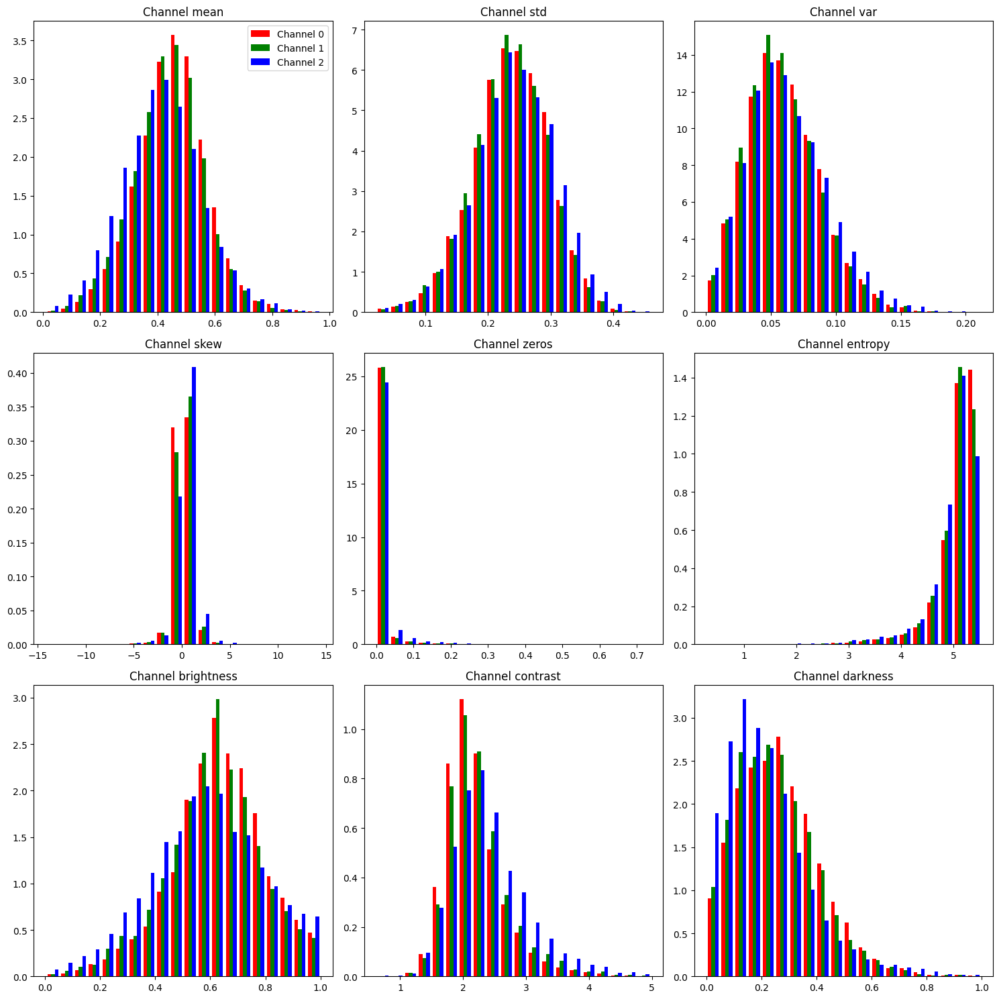

In [14]:
ch_mask = ch_stats.pixelstats.get_channel_mask(None, 3)
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
label_kwarg = {"label": ["Channel 0", "Channel 1", "Channel 2"]}

for ax, metric in zip(
    axs.flat, ["mean", "std", "var", "skew", "zeros", "entropy", "brightness", "contrast", "darkness"]
):
    # Plot the histogram for the chosen metric
    # Since each image has 3 channels, a reshape is needed for matplotlib
    # because matplotlib treats the # of columns as different datasets
    ax.hist(
        ds_channel_stats[metric][ch_mask].reshape(-1, 3),
        bins=20,
        density=True,
        color=["red", "green", "blue"],
        **label_kwarg,
    )
    ax.set_title(f"Channel {metric}")

    # Set label for first chart only
    if label_kwarg:
        ax.legend()
        label_kwarg = {}

plt.tight_layout()
plt.show()

In [15]:
# Initialize the Outliers class
outliers = Outliers(outlier_method="zscore")

# Find the extreme images
outlier_imgs = outliers.from_stats(stats)

# View the number of extreme images
print(f"Number of images with extreme values: {len(outlier_imgs)}")

Number of images with extreme values: 498


In [16]:
# List the metrics with an extreme value
metrics = {}
for img, group in outlier_imgs.issues.items():
    for extreme in group:
        if extreme in metrics:
            metrics[extreme].append(img)
        else:
            metrics[extreme] = [img]
print(f"Number of metrics with extremes: {len(metrics)}")

# Show the total number of extreme values for each metric
for group, imgs in sorted(metrics.items(), key=lambda item: len(item[1]), reverse=True):
    print(f"  {group} - {len(imgs)}")

Number of metrics with extremes: 15
  size - 173
  entropy - 123
  zeros - 100
  contrast - 92
  skew - 89
  kurtosis - 73
  darkness - 52
  width - 43
  var - 35
  aspect_ratio - 33
  mean - 29
  std - 22
  height - 22
  brightness - 20
  blurriness - 2


In [17]:
# Show each metric by class
# Determine which classes are present in each image
class_wise = {obj: {} for obj in sorted(object_counts.keys())}
for group, imgs in metrics.items():
    for img in imgs:
        unique_items = set(labels[img])
        for cat in unique_items:
            if group not in class_wise[cat]:
                class_wise[cat][group] = 0
            class_wise[cat][group] += 1

# Create the table for displaying
table_header = ["      Class"]
for group in sorted(metrics.keys()):
    table_header.append(f"{group:^10}")
table_header.append("  Total")
table = [table_header]
for class_cat, results in class_wise.items():
    table_rows = [f"{class_cat:>11}"]
    total = 0
    for group in sorted(metrics.keys()):
        if group == "aspect_ratio":
            if group in results:
                table_rows.append(f"{results[group]:^12}")
                total += results[group]
            else:
                table_rows.append(f"{0:^12}")
        else:
            if group in results:
                table_rows.append(f"{results[group]:^10}")
                total += results[group]
            else:
                table_rows.append(f"{0:^10}")
    table_rows.append(f"  {total:^5}")
    table.append(table_rows)

In [18]:
# Display the table
for row in table:
    print(" | ".join(row))

      Class | aspect_ratio | blurriness | brightness |  contrast  |  darkness  |  entropy   |   height   |  kurtosis  |    mean    |    size    |    skew    |    std     |    var     |   width    |   zeros    |   Total
  aeroplane |      7       |     0      |     2      |     4      |     22     |     28     |     5      |     23     |     7      |     12     |     30     |     6      |     1      |     1      |     2      |    150 
    bicycle |      0       |     0      |     0      |     3      |     1      |     3      |     0      |     2      |     1      |     10     |     3      |     0      |     0      |     5      |     3      |    31  
       bird |      3       |     0      |     1      |     3      |     8      |     16     |     1      |     12     |     1      |     10     |     14     |     5      |     0      |     1      |     9      |    84  
       boat |      7       |     0      |     1      |     2      |     2      |     6      |     4      |     2      |     

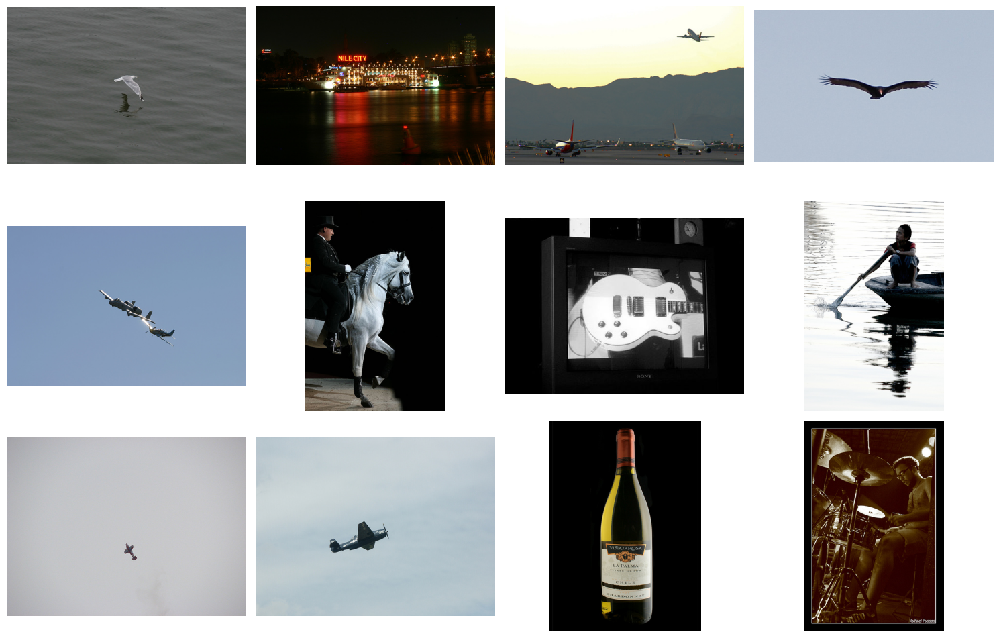

In [19]:
# Plot random images from each metric
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
selected_index = rng.choice(metrics["entropy"], 12, replace=False)

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.axis("off")

plt.tight_layout()
plt.show()

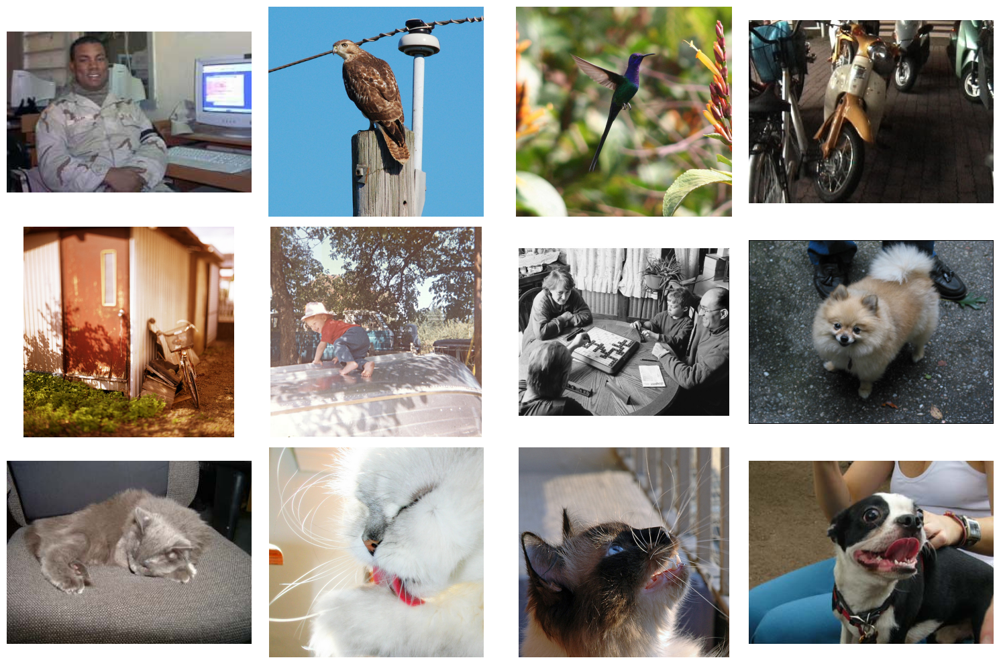

In [20]:
# Plot random images from each metric
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
selected_index = rng.choice(metrics["size"], 12, replace=False)

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.axis("off")

plt.tight_layout()
plt.show()

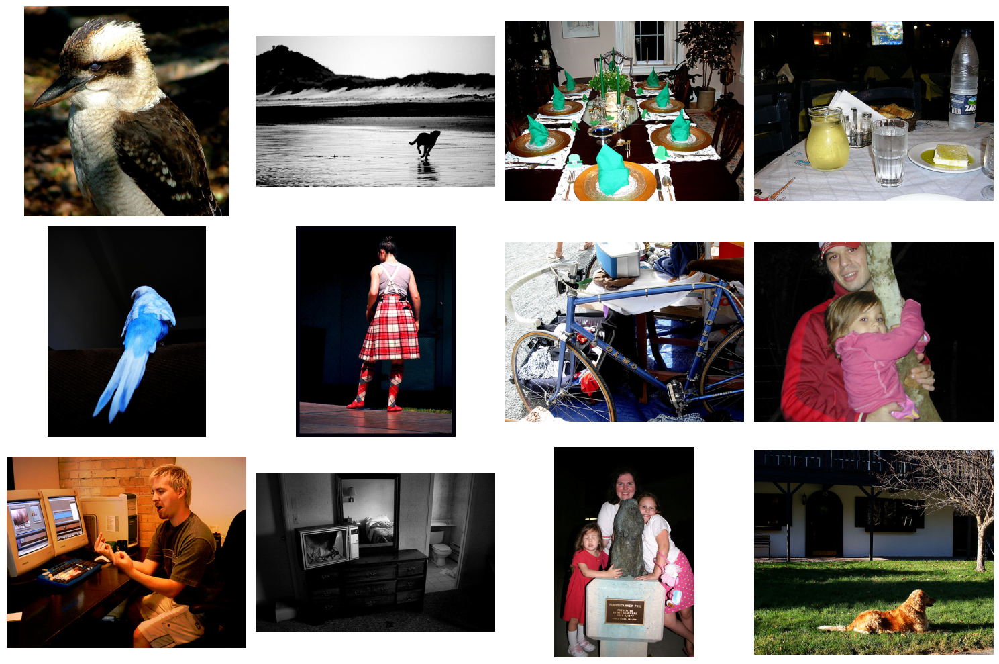

In [21]:
# Plot random images from each metric
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
selected_index = rng.choice(metrics["zeros"], 12, replace=False)

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.axis("off")

plt.tight_layout()
plt.show()

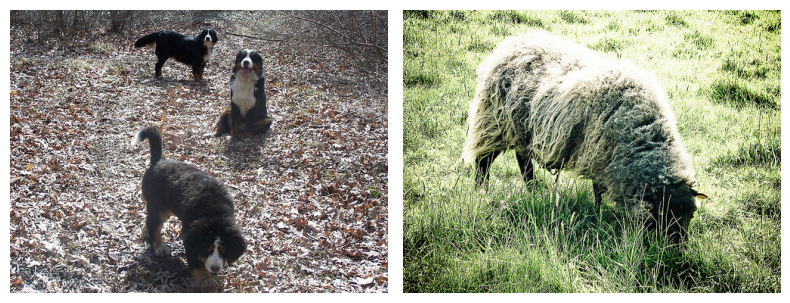

In [22]:
# Plot random images from each metric
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
selected_index = metrics["blurriness"]

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.axis("off")

plt.tight_layout()
plt.show()

In [23]:
# Initialize the Duplicates class
dups = Duplicates()

# Find the duplicates
dups.evaluate(img_list)

  0%|                                                                                          | 0/5717 [00:00<?, ?it/s]

  1%|▊                                                                               | 60/5717 [00:00<00:09, 597.20it/s]

  3%|██                                                                             | 152/5717 [00:00<00:07, 783.88it/s]

  5%|███▋                                                                           | 268/5717 [00:00<00:05, 954.59it/s]

  7%|█████▏                                                                        | 380/5717 [00:00<00:05, 1017.04it/s]

  9%|██████▋                                                                       | 493/5717 [00:00<00:04, 1056.28it/s]

 11%|████████▏                                                                     | 601/5717 [00:00<00:04, 1062.60it/s]

 12%|█████████▋                                                                    | 708/5717 [00:00<00:04, 1055.35it/s]

 14%|███████████                                                                   | 814/5717 [00:00<00:04, 1009.68it/s]

 16%|████████████▌                                                                 | 925/5717 [00:00<00:04, 1037.52it/s]

 18%|██████████████▏                                                              | 1055/5717 [00:01<00:04, 1114.66it/s]

 21%|███████████████▊                                                             | 1174/5717 [00:01<00:03, 1136.41it/s]

 23%|█████████████████▎                                                           | 1288/5717 [00:01<00:04, 1103.43it/s]

 25%|██████████████████▉                                                          | 1408/5717 [00:01<00:03, 1130.18it/s]

 27%|████████████████████▌                                                        | 1527/5717 [00:01<00:03, 1147.51it/s]

 29%|██████████████████████▎                                                      | 1654/5717 [00:01<00:03, 1181.04it/s]

 31%|████████████████████████                                                     | 1784/5717 [00:01<00:03, 1215.18it/s]

 33%|█████████████████████████▋                                                   | 1906/5717 [00:01<00:03, 1182.56it/s]

 35%|███████████████████████████▎                                                 | 2025/5717 [00:01<00:03, 1181.02it/s]

 38%|████████████████████████████▉                                                | 2152/5717 [00:01<00:02, 1205.68it/s]

 40%|██████████████████████████████▌                                              | 2273/5717 [00:02<00:02, 1186.21it/s]

 42%|████████████████████████████████▏                                            | 2393/5717 [00:02<00:02, 1189.92it/s]

 44%|█████████████████████████████████▊                                           | 2513/5717 [00:02<00:02, 1176.13it/s]

 46%|███████████████████████████████████▍                                         | 2633/5717 [00:02<00:02, 1180.85it/s]

 48%|█████████████████████████████████████                                        | 2752/5717 [00:02<00:02, 1177.56it/s]

 50%|██████████████████████████████████████▋                                      | 2870/5717 [00:02<00:02, 1131.62it/s]

 52%|████████████████████████████████████████▏                                    | 2984/5717 [00:02<00:02, 1130.07it/s]

 54%|█████████████████████████████████████████▋                                   | 3098/5717 [00:02<00:02, 1110.35it/s]

 56%|███████████████████████████████████████████▏                                 | 3210/5717 [00:02<00:02, 1077.55it/s]

 58%|████████████████████████████████████████████▋                                | 3319/5717 [00:03<00:02, 1048.26it/s]

 60%|██████████████████████████████████████████████▏                              | 3425/5717 [00:03<00:02, 1018.59it/s]

 62%|████████████████████████████████████████████████▏                             | 3528/5717 [00:03<00:02, 967.81it/s]

 63%|█████████████████████████████████████████████████▍                            | 3626/5717 [00:03<00:02, 909.74it/s]

 65%|██████████████████████████████████████████████████▋                           | 3718/5717 [00:03<00:02, 899.67it/s]

 67%|████████████████████████████████████████████████████▎                         | 3835/5717 [00:03<00:01, 972.03it/s]

 69%|█████████████████████████████████████████████████████▎                       | 3962/5717 [00:03<00:01, 1054.84it/s]

 71%|██████████████████████████████████████████████████████▊                      | 4074/5717 [00:03<00:01, 1071.72it/s]

 73%|████████████████████████████████████████████████████████▎                    | 4183/5717 [00:03<00:01, 1032.75it/s]

 75%|█████████████████████████████████████████████████████████▊                   | 4290/5717 [00:03<00:01, 1041.41it/s]

 77%|███████████████████████████████████████████████████████████▏                 | 4395/5717 [00:04<00:01, 1040.23it/s]

 79%|████████████████████████████████████████████████████████████▊                | 4512/5717 [00:04<00:01, 1074.24it/s]

 81%|██████████████████████████████████████████████████████████████▏              | 4620/5717 [00:04<00:01, 1001.55it/s]

 83%|████████████████████████████████████████████████████████████████▍             | 4722/5717 [00:04<00:01, 965.15it/s]

 84%|█████████████████████████████████████████████████████████████████▊            | 4820/5717 [00:04<00:00, 962.65it/s]

 86%|███████████████████████████████████████████████████████████████████▏          | 4928/5717 [00:04<00:00, 995.26it/s]

 88%|███████████████████████████████████████████████████████████████████▉         | 5045/5717 [00:04<00:00, 1043.79it/s]

 90%|█████████████████████████████████████████████████████████████████████▍       | 5151/5717 [00:04<00:00, 1023.68it/s]

 92%|██████████████████████████████████████████████████████████████████████▊      | 5254/5717 [00:04<00:00, 1003.80it/s]

 94%|████████████████████████████████████████████████████████████████████████▏    | 5359/5717 [00:05<00:00, 1016.73it/s]

 96%|█████████████████████████████████████████████████████████████████████████▋   | 5467/5717 [00:05<00:00, 1034.22it/s]

 98%|███████████████████████████████████████████████████████████████████████████▏ | 5584/5717 [00:05<00:00, 1073.04it/s]

100%|████████████████████████████████████████████████████████████████████████████▋| 5694/5717 [00:05<00:00, 1079.29it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 5717/5717 [00:05<00:00, 1064.55it/s]

DuplicatesOutput(exact=[], near=[])

In [24]:
# Create exact and duplicate images

# Copy images 23 and 46 to create exact duplicates
# Copy and crop images 5 and 4376 to create near duplicates
dupes = [
    img_list[23],
    img_list[46],
    img_list[5][:, 5:-5, 5:-5],
    img_list[4376][:, :-5, 5:],
]

dupes_stats = hashstats(dupes)

  0%|                                                                                             | 0/4 [00:00<?, ?it/s]

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 389.30it/s]

In [25]:
# Find the duplicates appended to the dataset
duplicates = dups.from_stats([dups.stats, dupes_stats])
print(f"exact: {duplicates.exact}")
print(f"near: {duplicates.near}")

exact: [{0: [23], 1: [0]}, {0: [46], 1: [1]}]
near: [{0: [5], 1: [2]}, {0: [4376], 1: [3]}]
